In [1]:
import pandas as pd
import tensorflow as tf
import tensorflow.keras.layers as layers
import tensorflow.keras.activations as Actications
import tensorflow.keras.models as Models
import tensorflow.keras.optimizers as Optimizer
import tensorflow.keras.metrics as Metrics
import tensorflow.keras.utils as Utils
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image

import efficientnet.keras as efn

import os
import pickle
import matplotlib.pyplot as plot
import cv2
import numpy as np
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix as CM
from random import randint
from IPython.display import SVG
from PIL import Image
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
from tqdm import tqdm 


In [14]:
lab = pickle.load(open("../src/labels.pkl","rb"))
[*lab][0]

'buildings'

In [2]:
import psutil
# gives a single float value
psutil.cpu_percent()

8.1

In [3]:
# gives an object with many fields
psutil.virtual_memory()

svmem(total=16857182208, available=8450785280, percent=49.9, used=8406396928, free=8450785280)

In [4]:
# you can convert that object to a dictionary 
dict(psutil.virtual_memory()._asdict())

{'total': 16857182208,
 'available': 8448573440,
 'percent': 49.9,
 'used': 8408608768,
 'free': 8448573440}

In [5]:
# you can have the percentage of used RAM
psutil.virtual_memory().percent

49.9

In [6]:
# tf.config.experimental.set_visible_devices(devices=gpus[1], device_type="GPU")
# tf.config.experimental.set_memory_growth(device=gpus[0], enable=True)

In [7]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Setup

In [8]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 4928296780495028478
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 3667263488
locality {
  bus_id: 1
  links {
  }
}
incarnation: 3961039075934334183
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [9]:
print(tf.test.is_built_with_cuda())

True


In [10]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [11]:
msg = tf.constant('Hello, TensorFlow!')
tf.print(msg)

Hello, TensorFlow!


In [12]:
os.cpu_count()

20

In [13]:
tf.config.experimental.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [14]:
import os
os.getcwd()

'c:\\Users\\Grisdy\\Documents\\project_grisdy\\image_classification_project\\notebook'

# Setting Data

In [15]:
def get_images(directory):
    Images = []
    Labels = []  # 0 for Building , 1 for forest, 2 for glacier, 3 for mountain, 4 for Sea , 5 for Street
    label = 0
    
    for labels in os.listdir(directory): #Main Directory where each class label is present as folder name.
        if labels == 'glacier': #Folder contain Glacier Images get the '2' class label.
            label = 2
        elif labels == 'sea':
            label = 4
        elif labels == 'buildings':
            label = 0
        elif labels == 'forest':
            label = 1
        elif labels == 'street':
            label = 5
        elif labels == 'mountain':
            label = 3
        
        for image_file in os.listdir(directory+labels): #Extracting the file name of the image from Class Label folder
            image = cv2.imread(directory+labels+r'/'+image_file) #Reading the image (OpenCV)
            image = cv2.resize(image,(128,128)) #Resize the image, Some images are different sizes. (Resizing is very Important)
            Images.append(image)
            Labels.append(label)
    
    return shuffle(Images,Labels,random_state=777) #Shuffle the dataset you just prepared.

def get_classlabel(class_code):
    labels = {2:'glacier', 4:'sea', 0:'buildings', 1:'forest', 5:'street', 3:'mountain'}
    
    return labels[class_code]

In [16]:
Images, Labels = get_images('../data/seg_train/') #Extract the training images from the folders.

Images = np.array(Images) #converting the list of images to numpy array.
Labels = np.array(Labels) 

In [17]:
print("Shape of Images:",Images.shape)
print("Shape of Labels:",Labels.shape)

plot.subplots_adjust()


Shape of Images: (14034, 128, 128, 3)
Shape of Labels: (14034,)


<Figure size 432x288 with 0 Axes>

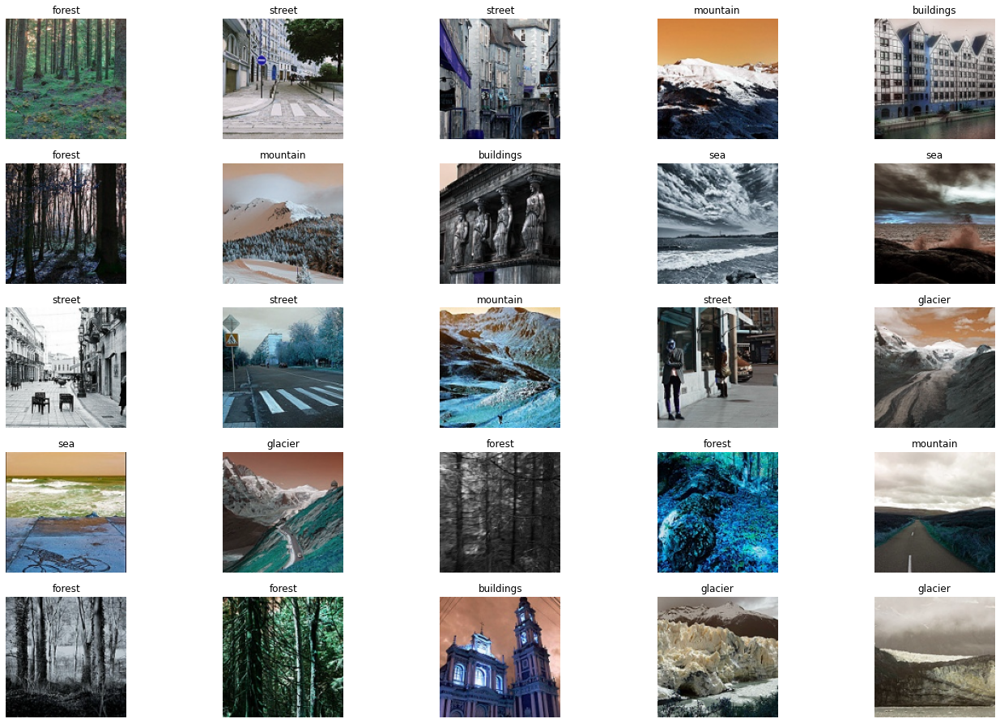

In [18]:
f,ax = plot.subplots(5,5) 
f.subplots_adjust(0,0,3,3)
for i in range(0,5,1):
    for j in range(0,5,1):
        rnd_number = randint(0,len(Images))
        ax[i,j].imshow(Images[rnd_number])
        ax[i,j].set_title(get_classlabel(Labels[rnd_number]))
        ax[i,j].axis('off')

# Data Generator

In [2]:
#Path Train, Test, Pred
train_path='../data/seg_train/'
test_path='../data/seg_test/'
# pred_path='../data/seg_pred/'

In [3]:
#setup the dim,channel, and batch
dim = (224, 224)
channel = (3,)
input_shape = dim + channel
    
batch_size = 10

In [5]:
#Create Image data generator

def train_val_generators(path, dim, batch_size):
    datagen = ImageDataGenerator(rescale=1/255,
                        width_shift_range=0.2,
                        height_shift_range=0.2,
                        zoom_range=0.2,
                        vertical_flip=True,
                        validation_split=0.20)
    
    train_generators = datagen.flow_from_directory(path, 
                                            batch_size=batch_size,                                            
                                            target_size=dim,
                                            shuffle=True,
                                            seed=77,
                                            class_mode='categorical',
                                            subset='training'
                                           )
    
    validation_generators = datagen.flow_from_directory(path, 
                                            batch_size=batch_size,
                                            target_size=dim,
                                            shuffle=False,
                                            class_mode='categorical',
                                            subset='validation'
                                           )

    return train_generators, validation_generators

#Create Image test data generator
def test_generators(path, dim, batch_size):
    datagen = ImageDataGenerator(rescale=1/255)
    
    test_generators = datagen.flow_from_directory(path, 
                                            batch_size=batch_size,
                                            class_mode='categorical',
                                            target_size=dim,
                                            shuffle=False
                                            )
    return test_generators

In [6]:
train_generator, validation_generator = train_val_generators(train_path, dim, batch_size)
test_generator = test_generators(test_path, dim, batch_size)

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [7]:
num_class = train_generator.num_classes
labels = train_generator.class_indices

In [8]:
labels

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

In [11]:
with open("../src/labels.pkl", "wb") as fp:   
    pickle.dump(labels, fp)

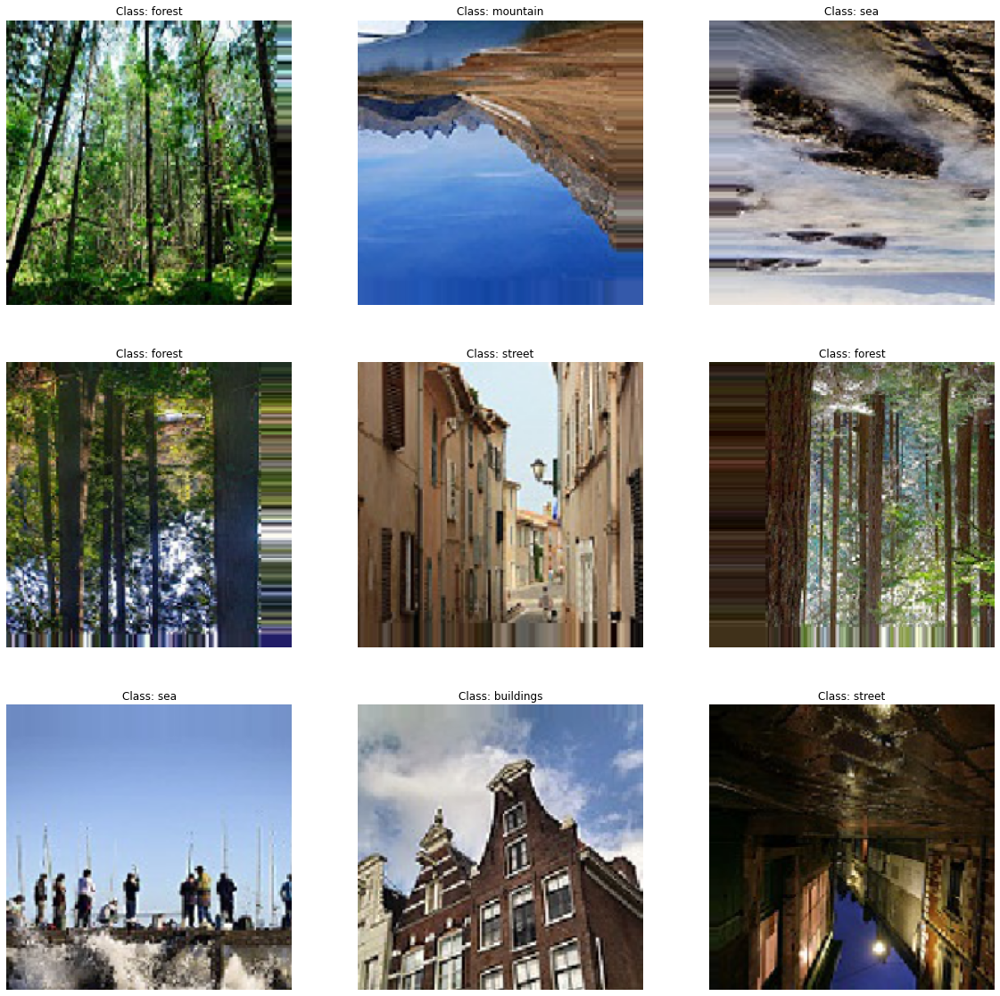

In [80]:
labels = [k for k,v in train_generator.class_indices.items()]
sample_generate = train_generator.__next__()
images = sample_generate[0]
titles = sample_generate[1]
plt.figure(figsize = (20 , 20))

for i in range(9):
    plt.subplot(3, 3, i+1) #(baris, jumlah kolom, iterasi tiap gambar)
    plt.imshow(images[i])
    plt.title(f'Class: {labels[np.argmax(titles[i])]}')
    plt.axis("off")


In [264]:
for k,v in train_generator.class_indices.items():
    print(k,v)

buildings 0
forest 1
glacier 2
mountain 3
sea 4
street 5


In [41]:
#Setup Data from Generator for Training and process with the models
'''
We are using data from generator instead data from ImageDataGenerator 
Directly because it's mmore optimal in training process compared 
to using Generator from keras (ImageDataGenerator)
Source:
https://www.tensorflow.org/guide/data_performance
'''

def tf_data_generator(generator,dim):
    num_class = generator.num_classes
    tf_generator = tf.data.Dataset.from_generator(lambda: generator
    , output_types=(tf.float32, tf.float32)
    , output_shapes = ([None,dim[0],dim[1],channel[0]],[None,num_class])                                                 
                                                 )
    return tf_generator

In [42]:
train_data = tf_data_generator(train_generator,dim)
test_data = tf_data_generator(test_generator,dim)
validation_data = tf_data_generator(validation_generator,dim)

In [88]:
train_data

<FlatMapDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 6), dtype=tf.float32, name=None))>

In [237]:
len(sample_generate)

2

# Callback

In [27]:
# Setting up EarlyStopping Callback
earlystopping_callback = EarlyStopping(
    monitor='val_loss', 
    mode='min',
    patience=7, 
    restore_best_weights=True, 
    verbose=1,
    min_delta=0.001)

In [54]:
# Setting up model checkpoint
from tabnanny import verbose

def checkpoint_callback(model_name):
    model_checkpoint_callback = ModelCheckpoint(
        filepath=f'../model/checkpoint/checkpoint_{str(model_name)}',
        monitor='val_loss',
        mode='min',
        save_best_only=True,
        verbose=1)

    return model_checkpoint_callback

In [29]:
#Learning Rate reduction
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', 
                                            patience=4, 
                                            verbose=1, 
                                            factor=0.3, 
                                            min_lr=0.00000001)

# Train with Mobilenet V2

In [92]:
# Create the base model from the pre-trained model MobileNet V2
base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape,
                                               include_top=False,
                                               weights='imagenet')
base_model.trainable = False
x = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)

predictions = tf.keras.layers.Dense(num_class, activation='softmax')(x)
model = tf.keras.Model(base_model.input,predictions)

In [93]:
#LR recommendation for MobilenetV2 
# https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&cad=rja&uact=8&ved=2ahUKEwjmiseJwdT5AhUr2nMBHdGKBdQQFnoECBEQAw&url=https%3A%2F%2Fwww.researchgate.net%2Ffigure%2FThe-optimal-learning-rate-of-the-MobileNet-V2-model-is-166-10-3-We-are-using-this_fig3_343841421%23%3A~%3Atext%3Dlicense%253A%2520CC%2520BY-%2CThe%2520optimal%2520learning%2520rate%2520of%2520the%2520MobileNet%252DV2%2520model%2520is%2Crate%2520for%2520training%2520our%2520model%26text%3DRecycling%2520is%2520vital%2520for%2520a%2Cmanagement%2520waste%2520and%2520recycling%2520issues.&usg=AOvVaw0ZnwSLaZuRoXGxt6Txnalh
LR = 1.66 * (10**-3) 

model.compile(optimizer=Optimizer.Adam(learning_rate=LR),
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [35]:
#GPU yg lama sebelum split train-val (pake semua data train dan validation dari data val [gapake data pred])
history_gpu = model.fit(train_generate, 
                    epochs=30,
                    validation_data=val_generate, verbose=1,
                    callbacks=[earlystopping_callback])

Epoch 1/30
1404/1404 [==============================] - 117s 77ms/step - loss: 0.8291 - accuracy: 0.6922 - val_loss: 0.4280 - val_accuracy: 0.8560
Epoch 2/30
1404/1404 [==============================] - 111s 79ms/step - loss: 0.4658 - accuracy: 0.8330 - val_loss: 0.3462 - val_accuracy: 0.8753
Epoch 3/30
1404/1404 [==============================] - 109s 78ms/step - loss: 0.4077 - accuracy: 0.8522 - val_loss: 0.3205 - val_accuracy: 0.8833
Epoch 4/30
1404/1404 [==============================] - 117s 83ms/step - loss: 0.3830 - accuracy: 0.8616 - val_loss: 0.2993 - val_accuracy: 0.8947
Epoch 5/30
1404/1404 [==============================] - 108s 77ms/step - loss: 0.3635 - accuracy: 0.8651 - val_loss: 0.2883 - val_accuracy: 0.8963
Epoch 6/30
1404/1404 [==============================] - 105s 75ms/step - loss: 0.3596 - accuracy: 0.8643 - val_loss: 0.2866 - val_accuracy: 0.8970
Epoch 7/30
1404/1404 [==============================] - 107s 76ms/step - loss: 0.3442 - accuracy: 0.8750 - val_loss: 0

In [55]:
model_checkpoint_callback=checkpoint_callback('mobile')

In [49]:
#GPU with split data from train (80-20) Ver.1.0 [callback wth 10 early stopping, and learning rate red 5]
history_gpu = model.fit(train_generator, 
                    epochs=30,
                    validation_data=validation_generator, verbose=1,
                    callbacks=[earlystopping_callback,model_checkpoint_callback,learning_rate_reduction])

Epoch 1/30
1123/1123 [==============================] - ETA: 0s - loss: 0.4826 - accuracy: 0.8218

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 113s 92ms/step - loss: 0.4826 - accuracy: 0.8218 - val_loss: 0.4526 - val_accuracy: 0.8402 - lr: 0.0017
Epoch 2/30
1123/1123 [==============================] - 91s 81ms/step - loss: 0.4084 - accuracy: 0.8559 - val_loss: 0.5410 - val_accuracy: 0.8238 - lr: 0.0017
Epoch 3/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3958 - accuracy: 0.8618

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 98s 87ms/step - loss: 0.3958 - accuracy: 0.8618 - val_loss: 0.3989 - val_accuracy: 0.8559 - lr: 0.0017
Epoch 4/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3772 - accuracy: 0.8682

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 99s 88ms/step - loss: 0.3772 - accuracy: 0.8682 - val_loss: 0.3890 - val_accuracy: 0.8727 - lr: 0.0017
Epoch 5/30
1123/1123 [==============================] - 99s 88ms/step - loss: 0.3690 - accuracy: 0.8707 - val_loss: 0.5130 - val_accuracy: 0.8324 - lr: 0.0017
Epoch 6/30
1123/1123 [==============================] - 95s 84ms/step - loss: 0.3668 - accuracy: 0.8685 - val_loss: 0.4411 - val_accuracy: 0.8549 - lr: 0.0017
Epoch 7/30
1123/1123 [==============================] - 93s 83ms/step - loss: 0.3790 - accuracy: 0.8654 - val_loss: 0.4129 - val_accuracy: 0.8602 - lr: 0.0017
Epoch 8/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3701 - accuracy: 0.8720

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 100s 89ms/step - loss: 0.3701 - accuracy: 0.8720 - val_loss: 0.3633 - val_accuracy: 0.8759 - lr: 0.0017
Epoch 9/30
1123/1123 [==============================] - 95s 85ms/step - loss: 0.3596 - accuracy: 0.8730 - val_loss: 0.4429 - val_accuracy: 0.8588 - lr: 0.0017
Epoch 10/30
1123/1123 [==============================] - 93s 83ms/step - loss: 0.3753 - accuracy: 0.8701 - val_loss: 0.4145 - val_accuracy: 0.8727 - lr: 0.0017
Epoch 11/30
1123/1123 [==============================] - 93s 83ms/step - loss: 0.3513 - accuracy: 0.8759 - val_loss: 0.4134 - val_accuracy: 0.8688 - lr: 0.0017
Epoch 12/30
1123/1123 [==============================] - 94s 83ms/step - loss: 0.3487 - accuracy: 0.8767 - val_loss: 0.4445 - val_accuracy: 0.8648 - lr: 0.0017
Epoch 13/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3567 - accuracy: 0.8763
Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0004979999852366745.
1123/1123 [=========================

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 102s 91ms/step - loss: 0.2787 - accuracy: 0.8968 - val_loss: 0.3474 - val_accuracy: 0.8802 - lr: 4.9800e-04
Epoch 18/30
1123/1123 [==============================] - 94s 84ms/step - loss: 0.2819 - accuracy: 0.8918 - val_loss: 0.3584 - val_accuracy: 0.8802 - lr: 4.9800e-04
Epoch 19/30
1123/1123 [==============================] - 95s 84ms/step - loss: 0.2759 - accuracy: 0.8985 - val_loss: 0.3634 - val_accuracy: 0.8695 - lr: 4.9800e-04
Epoch 20/30
1123/1123 [==============================] - 96s 86ms/step - loss: 0.2840 - accuracy: 0.8939 - val_loss: 0.3681 - val_accuracy: 0.8766 - lr: 4.9800e-04
Epoch 21/30
1123/1123 [==============================] - 93s 83ms/step - loss: 0.2884 - accuracy: 0.8948 - val_loss: 0.3565 - val_accuracy: 0.8741 - lr: 4.9800e-04
Epoch 22/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8980
Epoch 22: ReduceLROnPlateau reducing learning rate to 0.00014940000255592167.
1123/1123 [===

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 102s 91ms/step - loss: 0.2592 - accuracy: 0.8986 - val_loss: 0.3465 - val_accuracy: 0.8780 - lr: 1.4940e-04
Epoch 24/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2671 - accuracy: 0.9014

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 106s 94ms/step - loss: 0.2671 - accuracy: 0.9014 - val_loss: 0.3432 - val_accuracy: 0.8798 - lr: 1.4940e-04
Epoch 25/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2545 - accuracy: 0.9045

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 110s 98ms/step - loss: 0.2545 - accuracy: 0.9045 - val_loss: 0.3262 - val_accuracy: 0.8823 - lr: 1.4940e-04
Epoch 26/30
1123/1123 [==============================] - 97s 86ms/step - loss: 0.2492 - accuracy: 0.9056 - val_loss: 0.3519 - val_accuracy: 0.8745 - lr: 1.4940e-04
Epoch 27/30
1123/1123 [==============================] - 97s 86ms/step - loss: 0.2422 - accuracy: 0.9069 - val_loss: 0.3461 - val_accuracy: 0.8791 - lr: 1.4940e-04
Epoch 28/30
1123/1123 [==============================] - 97s 86ms/step - loss: 0.2539 - accuracy: 0.9052 - val_loss: 0.3489 - val_accuracy: 0.8809 - lr: 1.4940e-04
Epoch 29/30
1123/1123 [==============================] - 97s 87ms/step - loss: 0.2539 - accuracy: 0.9058 - val_loss: 0.3658 - val_accuracy: 0.8713 - lr: 1.4940e-04
Epoch 30/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2552 - accuracy: 0.9049
Epoch 30: ReduceLROnPlateau reducing learning rate to 4.48200007667765e-05.
1123/1123 [=====

In [107]:
#GPU pake data yg from_generator hasil outputnya di set
history_gpu = model.fit(train_data, 
                    epochs=30,
                    steps_per_epoch = len(train_generator),
                    validation_data = validation_data,
                    validation_steps = len(validation_generator), 
                    verbose=1,
                    callbacks=[earlystopping_callback,model_checkpoint_callback,learning_rate_reduction])


Epoch 1/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3642 - accuracy: 0.8750

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 162s 144ms/step - loss: 0.3642 - accuracy: 0.8750 - val_loss: 0.5549 - val_accuracy: 0.8238 - lr: 0.0017
Epoch 2/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3578 - accuracy: 0.8766

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 155s 138ms/step - loss: 0.3578 - accuracy: 0.8766 - val_loss: 0.4236 - val_accuracy: 0.8616 - lr: 0.0017
Epoch 3/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3552 - accuracy: 0.8775

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 157s 140ms/step - loss: 0.3552 - accuracy: 0.8775 - val_loss: 0.4161 - val_accuracy: 0.8655 - lr: 0.0017
Epoch 4/30
1123/1123 [==============================] - 151s 134ms/step - loss: 0.3486 - accuracy: 0.8826 - val_loss: 0.4249 - val_accuracy: 0.8659 - lr: 0.0017
Epoch 5/30
1123/1123 [==============================] - 150s 133ms/step - loss: 0.3482 - accuracy: 0.8803 - val_loss: 0.4436 - val_accuracy: 0.8581 - lr: 0.0017
Epoch 6/30
1123/1123 [==============================] - 151s 134ms/step - loss: 0.3542 - accuracy: 0.8778 - val_loss: 0.4330 - val_accuracy: 0.8709 - lr: 0.0017
Epoch 7/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3395 - accuracy: 0.8828
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0004979999852366745.
1123/1123 [==============================] - 150s 133ms/step - loss: 0.3395 - accuracy: 0.8828 - val_loss: 0.4609 - val_accuracy: 0.8577 - lr: 0.0017
Epoch 8/30
1123/1123 [=====================

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 161s 143ms/step - loss: 0.2925 - accuracy: 0.8913 - val_loss: 0.3621 - val_accuracy: 0.8777 - lr: 4.9800e-04
Epoch 9/30
1123/1123 [==============================] - 149s 133ms/step - loss: 0.2897 - accuracy: 0.8971 - val_loss: 0.3843 - val_accuracy: 0.8762 - lr: 4.9800e-04
Epoch 10/30
1123/1123 [==============================] - 151s 134ms/step - loss: 0.2813 - accuracy: 0.9005 - val_loss: 0.4004 - val_accuracy: 0.8620 - lr: 4.9800e-04
Epoch 11/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2804 - accuracy: 0.8964

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 158s 141ms/step - loss: 0.2804 - accuracy: 0.8964 - val_loss: 0.3542 - val_accuracy: 0.8780 - lr: 4.9800e-04
Epoch 12/30
1123/1123 [==============================] - 150s 133ms/step - loss: 0.2837 - accuracy: 0.8958 - val_loss: 0.3832 - val_accuracy: 0.8691 - lr: 4.9800e-04
Epoch 13/30
1123/1123 [==============================] - 152s 135ms/step - loss: 0.2845 - accuracy: 0.8952 - val_loss: 0.3660 - val_accuracy: 0.8734 - lr: 4.9800e-04
Epoch 14/30
1123/1123 [==============================] - 152s 135ms/step - loss: 0.2688 - accuracy: 0.9010 - val_loss: 0.3592 - val_accuracy: 0.8759 - lr: 4.9800e-04
Epoch 15/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2820 - accuracy: 0.8949

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 171s 152ms/step - loss: 0.2820 - accuracy: 0.8949 - val_loss: 0.3466 - val_accuracy: 0.8798 - lr: 4.9800e-04
Epoch 16/30
1123/1123 [==============================] - 176s 157ms/step - loss: 0.2687 - accuracy: 0.8973 - val_loss: 0.3594 - val_accuracy: 0.8791 - lr: 4.9800e-04
Epoch 17/30
1123/1123 [==============================] - 163s 145ms/step - loss: 0.2725 - accuracy: 0.8980 - val_loss: 0.3536 - val_accuracy: 0.8827 - lr: 4.9800e-04
Epoch 18/30
1123/1123 [==============================] - 153s 136ms/step - loss: 0.2729 - accuracy: 0.8966 - val_loss: 0.3725 - val_accuracy: 0.8755 - lr: 4.9800e-04
Epoch 19/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8984
Epoch 19: ReduceLROnPlateau reducing learning rate to 0.00014940000255592167.
1123/1123 [==============================] - 152s 135ms/step - loss: 0.2719 - accuracy: 0.8984 - val_loss: 0.3726 - val_accuracy: 0.8655 - lr: 4.9800e-04
Epoch 20/30
1123/

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 169s 151ms/step - loss: 0.2531 - accuracy: 0.9045 - val_loss: 0.3450 - val_accuracy: 0.8812 - lr: 1.4940e-04
Epoch 21/30
1123/1123 [==============================] - 181s 161ms/step - loss: 0.2556 - accuracy: 0.9053 - val_loss: 0.3480 - val_accuracy: 0.8766 - lr: 1.4940e-04
Epoch 22/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2478 - accuracy: 0.9098

INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


INFO:tensorflow:Assets written to: ..\checkpoint_from_gen\assets


1123/1123 [==============================] - 168s 150ms/step - loss: 0.2478 - accuracy: 0.9098 - val_loss: 0.3360 - val_accuracy: 0.8845 - lr: 1.4940e-04
Epoch 23/30
1123/1123 [==============================] - 169s 150ms/step - loss: 0.2631 - accuracy: 0.9012 - val_loss: 0.3447 - val_accuracy: 0.8752 - lr: 1.4940e-04
Epoch 24/30
1123/1123 [==============================] - 152s 135ms/step - loss: 0.2505 - accuracy: 0.9033 - val_loss: 0.3487 - val_accuracy: 0.8869 - lr: 1.4940e-04
Epoch 25/30
1123/1123 [==============================] - 160s 143ms/step - loss: 0.2468 - accuracy: 0.9084 - val_loss: 0.3622 - val_accuracy: 0.8820 - lr: 1.4940e-04
Epoch 26/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2535 - accuracy: 0.9047
Epoch 26: ReduceLROnPlateau reducing learning rate to 4.48200007667765e-05.
1123/1123 [==============================] - 180s 160ms/step - loss: 0.2535 - accuracy: 0.9047 - val_loss: 0.3688 - val_accuracy: 0.8777 - lr: 1.4940e-04
Epoch 27/30
1123/11

In [37]:
#GPU with split data from train (80-20) Ver.2.0 [callback wth 7 early stopping, and learning rate red 4]
history_gpu = model.fit(train_generator, 
                    epochs=30,
                    validation_data=validation_generator, verbose=1,
                    callbacks=[earlystopping_callback,model_checkpoint_callback,learning_rate_reduction])

Epoch 1/30
1123/1123 [==============================] - ETA: 0s - loss: 0.4853 - accuracy: 0.8178

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 122s 101ms/step - loss: 0.4853 - accuracy: 0.8178 - val_loss: 0.3715 - val_accuracy: 0.8648 - lr: 0.0017
Epoch 2/30
1123/1123 [==============================] - 118s 105ms/step - loss: 0.4093 - accuracy: 0.8562 - val_loss: 0.4370 - val_accuracy: 0.8531 - lr: 0.0017
Epoch 3/30
1123/1123 [==============================] - 116s 103ms/step - loss: 0.3805 - accuracy: 0.8650 - val_loss: 0.4551 - val_accuracy: 0.8431 - lr: 0.0017
Epoch 4/30
1123/1123 [==============================] - 113s 100ms/step - loss: 0.3997 - accuracy: 0.8595 - val_loss: 0.4018 - val_accuracy: 0.8545 - lr: 0.0017
Epoch 5/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3900 - accuracy: 0.8627
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0004979999852366745.
1123/1123 [==============================] - 100s 89ms/step - loss: 0.3900 - accuracy: 0.8627 - val_loss: 0.3991 - val_accuracy: 0.8563 - lr: 0.0017
Epoch 6/30
1123/1123 [======================

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 101s 90ms/step - loss: 0.3102 - accuracy: 0.8874 - val_loss: 0.3611 - val_accuracy: 0.8709 - lr: 4.9800e-04
Epoch 7/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2977 - accuracy: 0.8905

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 99s 88ms/step - loss: 0.2977 - accuracy: 0.8905 - val_loss: 0.3459 - val_accuracy: 0.8730 - lr: 4.9800e-04
Epoch 8/30
1123/1123 [==============================] - 96s 85ms/step - loss: 0.2902 - accuracy: 0.8910 - val_loss: 0.3609 - val_accuracy: 0.8809 - lr: 4.9800e-04
Epoch 9/30
1123/1123 [==============================] - 94s 84ms/step - loss: 0.2974 - accuracy: 0.8900 - val_loss: 0.3616 - val_accuracy: 0.8705 - lr: 4.9800e-04
Epoch 10/30
1123/1123 [==============================] - 93s 83ms/step - loss: 0.2970 - accuracy: 0.8862 - val_loss: 0.3577 - val_accuracy: 0.8766 - lr: 4.9800e-04
Epoch 11/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2871 - accuracy: 0.8943
Epoch 11: ReduceLROnPlateau reducing learning rate to 0.00014940000255592167.
1123/1123 [==============================] - 93s 82ms/step - loss: 0.2871 - accuracy: 0.8943 - val_loss: 0.3553 - val_accuracy: 0.8734 - lr: 4.9800e-04
Epoch 12/30
1123/1123 [======

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 101s 90ms/step - loss: 0.2710 - accuracy: 0.8953 - val_loss: 0.3375 - val_accuracy: 0.8805 - lr: 1.4940e-04
Epoch 13/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2759 - accuracy: 0.8961

INFO:tensorflow:Assets written to: ..\checkpoint\assets


INFO:tensorflow:Assets written to: ..\checkpoint\assets


1123/1123 [==============================] - 116s 104ms/step - loss: 0.2759 - accuracy: 0.8961 - val_loss: 0.3189 - val_accuracy: 0.8877 - lr: 1.4940e-04
Epoch 14/30
1123/1123 [==============================] - 105s 94ms/step - loss: 0.2663 - accuracy: 0.8989 - val_loss: 0.3474 - val_accuracy: 0.8745 - lr: 1.4940e-04
Epoch 15/30
1123/1123 [==============================] - 113s 101ms/step - loss: 0.2703 - accuracy: 0.8979 - val_loss: 0.3342 - val_accuracy: 0.8766 - lr: 1.4940e-04
Epoch 16/30
1123/1123 [==============================] - 117s 104ms/step - loss: 0.2667 - accuracy: 0.8975 - val_loss: 0.3415 - val_accuracy: 0.8752 - lr: 1.4940e-04
Epoch 17/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2662 - accuracy: 0.9011
Epoch 17: ReduceLROnPlateau reducing learning rate to 4.48200007667765e-05.
1123/1123 [==============================] - 103s 91ms/step - loss: 0.2662 - accuracy: 0.9011 - val_loss: 0.3347 - val_accuracy: 0.8730 - lr: 1.4940e-04
Epoch 18/30
1123/1123

In [108]:
#Save the training
model_path = '../model/model_split_gen'
tf.saved_model.save(model,model_path)

model.save('../model/model_split_gen.h5')


#Save history the training model (80-20)
with open('../model/history_model_gpu_split_gen','wb') as f:
    pickle.dump(history_gpu.history,f)

INFO:tensorflow:Assets written to: ../model/model_split_gen\assets


INFO:tensorflow:Assets written to: ../model/model_split_gen\assets


# Evaluation 

In [50]:
# #Load model from checkpoint (Must be rebuild model first after that add weight from latest checkpoint) 
# latest = tf.train.latest_checkpoint('../checkpoint') #load weight from latest checpoint
# model.load_weights('../checkpoint')

In [65]:
#load model with 
# model.save('../model/model_split.h5')

# model = tf.saved_model.load(model_path)

# history_file = "../model/history_model_gpu_split"
# history = pickle.load(open(history_file, 'rb'))


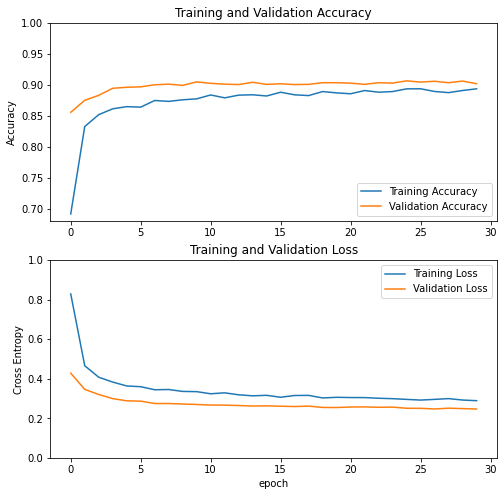

In [57]:
acc = history['accuracy']
val_acc = history['val_accuracy']

loss = history['loss']
val_loss = history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## Evaluation MobileNetV2

In [22]:
#Load the training history model (80-20)
path_mobile = '../model/model_split_gen.h5'

path_hist1 = "../model/history_model_gpu_split_gen"

# history = pd.read_pickle(hist_mobile)
model_mob = tf.keras.models.load_model(path_mobile)
history_mob = pickle.load(open(path_hist1, 'rb'))


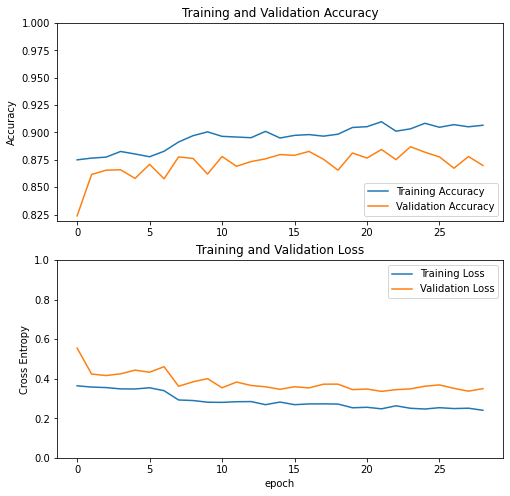

In [6]:
#Model train with ImageDataGen only
acc = history_mob['accuracy']
val_acc = history_mob['val_accuracy']

loss = history_mob['loss']
val_loss = history_mob['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')iy
plt.show()

In [78]:
# Confussion matrix 1st case with ImageDataGen only
y_test = test_generator.classes
y_pred = model.predict(test_generator)
# y_pred = np.argmax(y_pred,axis=1)
y_pred


300/300 [==============================] - 4s 15ms/step


array([[9.99988556e-01, 6.54416343e-09, 6.18467624e-08, 1.10915110e-09,
        8.65977938e-08, 1.12470161e-05],
       [9.81790662e-01, 3.59867300e-08, 1.14102605e-07, 2.46920511e-08,
        2.33876865e-08, 1.82092153e-02],
       [9.99233603e-01, 7.56050940e-06, 2.17359158e-07, 2.04165599e-06,
        4.00373574e-06, 7.52584718e-04],
       ...,
       [5.53195737e-03, 1.97271537e-03, 1.06509980e-02, 1.22785255e-01,
        1.08983517e-01, 7.50075579e-01],
       [4.54105556e-01, 2.12767990e-08, 2.84888210e-05, 2.70216810e-06,
        5.47448451e-07, 5.45862675e-01],
       [4.97057408e-05, 2.20473865e-07, 7.15616935e-08, 1.10454446e-08,
        1.09854454e-07, 9.99949813e-01]], dtype=float32)

In [46]:
# Confussion matrix 1st case with ImageDataGen only
y_test = test_generator.classes
y_pred = model_mob.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)


#Rresult with ImageDataGen only
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test,y_pred,target_names = labels))


300/300 [==============================] - 4s 12ms/step
              precision    recall  f1-score   support

   buildings       0.90      0.92      0.91       437
      forest       0.98      0.99      0.99       474
     glacier       0.83      0.85      0.84       553
    mountain       0.84      0.83      0.84       525
         sea       0.96      0.92      0.94       510
      street       0.93      0.91      0.92       501

    accuracy                           0.90      3000
   macro avg       0.91      0.91      0.90      3000
weighted avg       0.90      0.90      0.90      3000



In [68]:
y_test

array([0, 0, 0, ..., 5, 5, 5])

In [43]:
#Rresult with ImageDataGen only
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test,y_pred,target_names = labels))

              precision    recall  f1-score   support

   buildings       0.90      0.92      0.91       437
      forest       0.98      0.99      0.99       474
     glacier       0.83      0.85      0.84       553
    mountain       0.84      0.83      0.84       525
         sea       0.96      0.92      0.94       510
      street       0.93      0.91      0.92       501

    accuracy                           0.90      3000
   macro avg       0.91      0.91      0.90      3000
weighted avg       0.90      0.90      0.90      3000



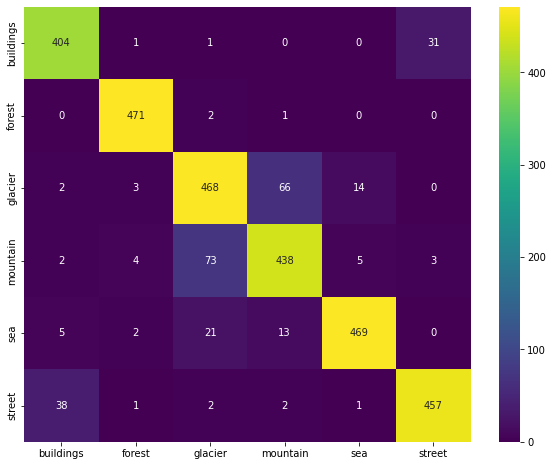

In [47]:
#CF with ImageDataGen only
import seaborn as sns
plt.figure(figsize=(10,8))
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.3g',xticklabels=labels,yticklabels=labels,cmap='viridis')
plt.show()

In [112]:
# Confussion matrix 1st case with DatafromGenerator 
y_test = test_generator.classes
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)
y_pred


300/300 [==============================] - 6s 17ms/step


array([0, 0, 0, ..., 5, 0, 5], dtype=int64)

In [ ]:
y_test

array([0, 0, 0, ..., 5, 5, 5])

In [114]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test,y_pred,target_names = labels))

              precision    recall  f1-score   support

   buildings       0.91      0.89      0.90       437
      forest       0.97      0.99      0.98       474
     glacier       0.82      0.87      0.84       553
    mountain       0.87      0.81      0.84       525
         sea       0.94      0.91      0.93       510
      street       0.90      0.92      0.91       501

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weighted avg       0.90      0.90      0.90      3000



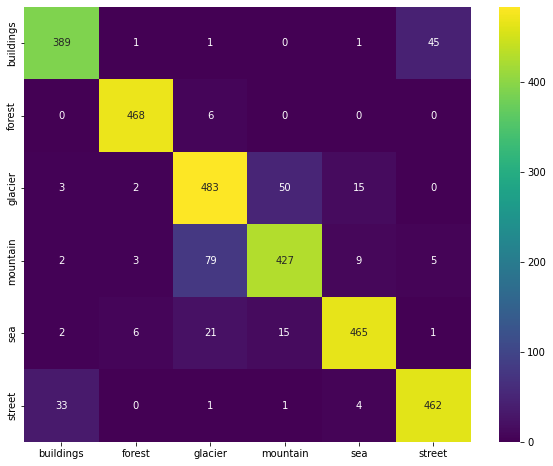

In [115]:
#CM with From DataGen  
import seaborn as sns
plt.figure(figsize=(10,8))
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.3g',xticklabels=labels,yticklabels=labels,cmap='viridis')
plt.show()

# Train with Efficientnet-B0

In [302]:
# !pip install efficientnet

     ---------------------------------------- 12.2/12.2 MB 3.9 MB/s eta 0:00:00
     ---------------------------------------- 50.7/50.7 kB 2.7 MB/s eta 0:00:00
     ---------------------------------------- 2.0/2.0 MB 4.0 MB/s eta 0:00:00
     ---------------------------------------- 4.2/4.2 MB 4.0 MB/s eta 0:00:00
     ---------------------------------------- 3.4/3.4 MB 3.6 MB/s eta 0:00:00
     -------------------------------------- 208.5/208.5 kB 4.2 MB/s eta 0:00:00


In [48]:
import efficientnet.keras as efn

In [49]:
base_b0 = efn.EfficientNetB0(input_shape = input_shape, 
                            include_top = False, 
                            weights = 'imagenet')

#Freeze params 
base_b0.trainable=False


In [57]:
x = base_b0.output
x = layers.GlobalAveragePooling2D()(x)
predictions = layers.Dense(num_class, activation='softmax')(x)

model_b0 = tf.keras.Model(base_b0.input, predictions)

In [58]:
#LR Recommendation
#https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/
LR = 1e-2

model_b0.compile(optimizer=Optimizer.Adam(learning_rate=LR),
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [329]:
model_b0.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 32  864         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn (BatchNormalization)   (None, 112, 112, 32  128         ['stem_conv[0][0]']              
                                )                                                           

In [56]:
model_checkpoint_b0=checkpoint_callback("b0")

In [60]:
#GPU pake data yg from_generator hasil outputnya di set
history_b0 = model_b0.fit(train_data, 
                    epochs=30,
                    steps_per_epoch = len(train_generator),
                    validation_data = validation_data,
                    validation_steps = len(validation_generator), 
                    verbose=1,
                    callbacks=[earlystopping_callback,model_checkpoint_b0,learning_rate_reduction])


Epoch 1/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6298 - accuracy: 0.8077
Epoch 1: val_loss improved from inf to 0.60253, saving model to ..\checkpoint_b0


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 186s 163ms/step - loss: 0.6298 - accuracy: 0.8077 - val_loss: 0.6025 - val_accuracy: 0.8235 - lr: 0.0100
Epoch 2/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6085 - accuracy: 0.8303
Epoch 2: val_loss improved from 0.60253 to 0.51352, saving model to ..\checkpoint_b0


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 194s 173ms/step - loss: 0.6085 - accuracy: 0.8303 - val_loss: 0.5135 - val_accuracy: 0.8620 - lr: 0.0100
Epoch 3/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5971 - accuracy: 0.8413
Epoch 3: val_loss did not improve from 0.51352
1123/1123 [==============================] - 163s 145ms/step - loss: 0.5971 - accuracy: 0.8413 - val_loss: 0.6780 - val_accuracy: 0.8406 - lr: 0.0100
Epoch 4/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5799 - accuracy: 0.8514
Epoch 4: val_loss did not improve from 0.51352
1123/1123 [==============================] - 150s 134ms/step - loss: 0.5799 - accuracy: 0.8514 - val_loss: 0.7069 - val_accuracy: 0.8288 - lr: 0.0100
Epoch 5/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5774 - accuracy: 0.8495
Epoch 5: val_loss did not improve from 0.51352
1123/1123 [==============================] - 162s 145ms/step - loss: 0.5774 - accuracy: 0.8495 - val_loss: 0.5479 -

INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 206s 184ms/step - loss: 0.4312 - accuracy: 0.8777 - val_loss: 0.4714 - val_accuracy: 0.8741 - lr: 0.0030
Epoch 8/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3796 - accuracy: 0.8833
Epoch 8: val_loss did not improve from 0.47144
1123/1123 [==============================] - 174s 155ms/step - loss: 0.3796 - accuracy: 0.8833 - val_loss: 0.5023 - val_accuracy: 0.8648 - lr: 0.0030
Epoch 9/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3800 - accuracy: 0.8820
Epoch 9: val_loss did not improve from 0.47144
1123/1123 [==============================] - 170s 151ms/step - loss: 0.3800 - accuracy: 0.8820 - val_loss: 0.4912 - val_accuracy: 0.8666 - lr: 0.0030
Epoch 10/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3493 - accuracy: 0.8846
Epoch 10: val_loss did not improve from 0.47144
1123/1123 [==============================] - 172s 153ms/step - loss: 0.3493 - accuracy: 0.8846 - val_loss: 0.4861

INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 193s 172ms/step - loss: 0.3572 - accuracy: 0.8834 - val_loss: 0.4347 - val_accuracy: 0.8688 - lr: 0.0030
Epoch 12/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3385 - accuracy: 0.8850
Epoch 12: val_loss did not improve from 0.43473
1123/1123 [==============================] - 174s 155ms/step - loss: 0.3385 - accuracy: 0.8850 - val_loss: 0.4371 - val_accuracy: 0.8791 - lr: 0.0030
Epoch 13/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3407 - accuracy: 0.8862
Epoch 13: val_loss did not improve from 0.43473
1123/1123 [==============================] - 178s 158ms/step - loss: 0.3407 - accuracy: 0.8862 - val_loss: 0.4530 - val_accuracy: 0.8641 - lr: 0.0030
Epoch 14/30
1123/1123 [==============================] - ETA: 0s - loss: 0.3406 - accuracy: 0.8841
Epoch 14: val_loss did not improve from 0.43473
1123/1123 [==============================] - 178s 159ms/step - loss: 0.3406 - accuracy: 0.8841 - val_loss: 0.

INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 196s 174ms/step - loss: 0.2969 - accuracy: 0.8967 - val_loss: 0.3744 - val_accuracy: 0.8791 - lr: 9.0000e-04
Epoch 17/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2942 - accuracy: 0.8966
Epoch 17: val_loss did not improve from 0.37436
1123/1123 [==============================] - 157s 140ms/step - loss: 0.2942 - accuracy: 0.8966 - val_loss: 0.3854 - val_accuracy: 0.8798 - lr: 9.0000e-04
Epoch 18/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2823 - accuracy: 0.9020
Epoch 18: val_loss did not improve from 0.37436
1123/1123 [==============================] - 152s 136ms/step - loss: 0.2823 - accuracy: 0.9020 - val_loss: 0.3810 - val_accuracy: 0.8834 - lr: 9.0000e-04
Epoch 19/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2745 - accuracy: 0.8996
Epoch 19: val_loss did not improve from 0.37436
1123/1123 [==============================] - 174s 155ms/step - loss: 0.2745 - accuracy: 0.8996 - 

INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 196s 174ms/step - loss: 0.2763 - accuracy: 0.9009 - val_loss: 0.3688 - val_accuracy: 0.8848 - lr: 9.0000e-04
Epoch 21/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2756 - accuracy: 0.8985
Epoch 21: val_loss improved from 0.36875 to 0.36699, saving model to ..\checkpoint_b0


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 192s 171ms/step - loss: 0.2756 - accuracy: 0.8985 - val_loss: 0.3670 - val_accuracy: 0.8780 - lr: 9.0000e-04
Epoch 22/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.8989
Epoch 22: val_loss did not improve from 0.36699
1123/1123 [==============================] - 167s 149ms/step - loss: 0.2719 - accuracy: 0.8989 - val_loss: 0.3776 - val_accuracy: 0.8798 - lr: 9.0000e-04
Epoch 23/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2711 - accuracy: 0.9017
Epoch 23: val_loss did not improve from 0.36699
1123/1123 [==============================] - 156s 139ms/step - loss: 0.2711 - accuracy: 0.9017 - val_loss: 0.3691 - val_accuracy: 0.8755 - lr: 9.0000e-04
Epoch 24/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2760 - accuracy: 0.8980
Epoch 24: val_loss improved from 0.36699 to 0.36638, saving model to ..\checkpoint_b0


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 170s 152ms/step - loss: 0.2760 - accuracy: 0.8980 - val_loss: 0.3664 - val_accuracy: 0.8802 - lr: 9.0000e-04
Epoch 25/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2711 - accuracy: 0.9008
Epoch 25: val_loss did not improve from 0.36638
1123/1123 [==============================] - 179s 159ms/step - loss: 0.2711 - accuracy: 0.9008 - val_loss: 0.3738 - val_accuracy: 0.8734 - lr: 9.0000e-04
Epoch 26/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2726 - accuracy: 0.9005
Epoch 26: val_loss improved from 0.36638 to 0.36342, saving model to ..\checkpoint_b0


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 216s 192ms/step - loss: 0.2726 - accuracy: 0.9005 - val_loss: 0.3634 - val_accuracy: 0.8755 - lr: 9.0000e-04
Epoch 27/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2755 - accuracy: 0.8980
Epoch 27: val_loss improved from 0.36342 to 0.35619, saving model to ..\checkpoint_b0


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b0\assets


1123/1123 [==============================] - 205s 183ms/step - loss: 0.2755 - accuracy: 0.8980 - val_loss: 0.3562 - val_accuracy: 0.8841 - lr: 9.0000e-04
Epoch 28/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2575 - accuracy: 0.9063
Epoch 28: val_loss did not improve from 0.35619
1123/1123 [==============================] - 152s 135ms/step - loss: 0.2575 - accuracy: 0.9063 - val_loss: 0.3721 - val_accuracy: 0.8741 - lr: 9.0000e-04
Epoch 29/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2795 - accuracy: 0.8990
Epoch 29: val_loss did not improve from 0.35619
1123/1123 [==============================] - 166s 148ms/step - loss: 0.2795 - accuracy: 0.8990 - val_loss: 0.3846 - val_accuracy: 0.8691 - lr: 9.0000e-04
Epoch 30/30
1123/1123 [==============================] - ETA: 0s - loss: 0.2669 - accuracy: 0.9009
Epoch 30: val_loss did not improve from 0.35619
1123/1123 [==============================] - 155s 138ms/step - loss: 0.2669 - accuracy: 0.9009 - 

In [61]:
#Save the training
model_b0_path = '../model/model_b0'
tf.saved_model.save(model_b0,model_b0_path)

model_b0.save('../model/model_b0.h5')


#Save history the training model (80-20)
with open('../model/history_model_b0','wb') as f:
    pickle.dump(history_b0.history,f)

INFO:tensorflow:Assets written to: ../model/model_b0\assets


INFO:tensorflow:Assets written to: ../model/model_b0\assets


In [63]:
history_b0 = pickle.load(open('../model/history_model_b0','rb'))


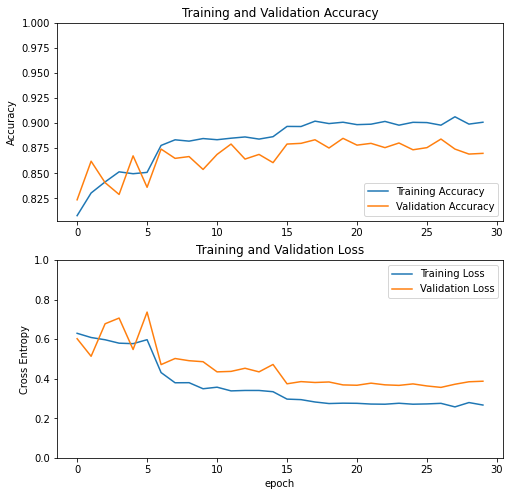

In [64]:
acc = history_b0['accuracy']
val_acc = history_b0['val_accuracy']

loss = history_b0['loss']
val_loss = history_b0['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [65]:
# Confussion matrix 1st case with DatafromGenerator 
y_test = test_generator.classes
y_pred_b0 = model_b0.predict(test_generator)
y_pred_b0 = np.argmax(y_pred_b0,axis=1)
y_pred_b0


300/300 [==============================] - 6s 19ms/step


array([0, 0, 0, ..., 5, 5, 5], dtype=int64)

In [68]:
#Rresult with ImageDataGen only
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test,y_pred_b0,target_names = labels))

              precision    recall  f1-score   support

   buildings       0.92      0.89      0.90       437
      forest       0.99      0.97      0.98       474
     glacier       0.82      0.84      0.83       553
    mountain       0.87      0.82      0.84       525
         sea       0.92      0.94      0.93       510
      street       0.89      0.94      0.91       501

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weighted avg       0.90      0.90      0.90      3000



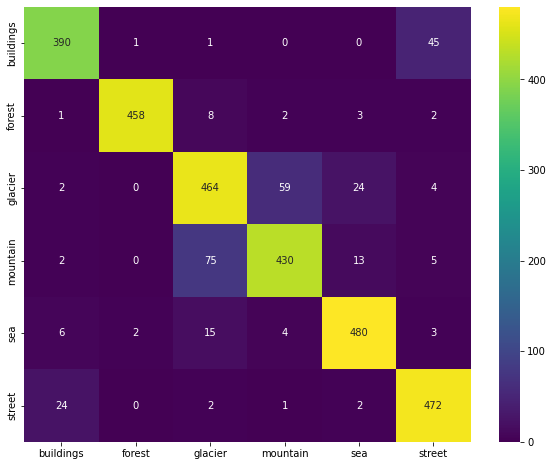

In [69]:
#CF with ImageDataGen only
import seaborn as sns
plt.figure(figsize=(10,8))
sns.heatmap(confusion_matrix(y_test,y_pred_b0),annot=True,fmt='.3g',xticklabels=labels,yticklabels=labels,cmap='viridis')
plt.show()

# Train with Efficientnet-B7

In [70]:
import efficientnet.keras as efn

In [72]:
base_b7 = efn.EfficientNetB7(input_shape = input_shape, 
                            include_top = False, 
                            weights = 'imagenet')

#Freeze params 
base_b7.trainable=False


258434480/258434480 [==============================] - 245s 1us/step


In [73]:
x = base_b7.output
x = layers.GlobalAveragePooling2D()(x)
predictions = layers.Dense(num_class, activation='softmax')(x)

model_b7 = tf.keras.Model(base_b7.input, predictions)

In [74]:
#LR Recommendation
#https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/
LR = 1e-2

model_b7.compile(optimizer=Optimizer.Adam(learning_rate=LR),
              loss="categorical_crossentropy",
              metrics=['accuracy'])

In [ ]:
model_b7.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 48  1296        ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn (BatchNormalization)   (None, 112, 112, 48  192         ['stem_conv[0][0]']              
                                )                                                           

In [75]:
model_checkpoint_b7=checkpoint_callback('b7')

In [76]:
#GPU pake data yg from_generator hasil outputnya di set
history_b7 = model_b7.fit(train_data, 
                    epochs=30,
                    steps_per_epoch = len(train_generator),
                    validation_data = validation_data,
                    validation_steps = len(validation_generator), 
                    verbose=1,
                    callbacks=[earlystopping_callback,model_checkpoint_b7,learning_rate_reduction])


Epoch 1/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2971 - accuracy: 0.7290
Epoch 1: val_loss improved from inf to 0.87202, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 398s 342ms/step - loss: 1.2971 - accuracy: 0.7290 - val_loss: 0.8720 - val_accuracy: 0.8035 - lr: 0.0100
Epoch 2/30
1123/1123 [==============================] - ETA: 0s - loss: 1.1909 - accuracy: 0.7688
Epoch 2: val_loss improved from 0.87202 to 0.82994, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 361s 321ms/step - loss: 1.1909 - accuracy: 0.7688 - val_loss: 0.8299 - val_accuracy: 0.8270 - lr: 0.0100
Epoch 3/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2590 - accuracy: 0.7796
Epoch 3: val_loss did not improve from 0.82994
1123/1123 [==============================] - 261s 233ms/step - loss: 1.2590 - accuracy: 0.7796 - val_loss: 0.8497 - val_accuracy: 0.8331 - lr: 0.0100
Epoch 4/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2514 - accuracy: 0.7874
Epoch 4: val_loss did not improve from 0.82994
1123/1123 [==============================] - 266s 237ms/step - loss: 1.2514 - accuracy: 0.7874 - val_loss: 0.8503 - val_accuracy: 0.8438 - lr: 0.0100
Epoch 5/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2654 - accuracy: 0.7904
Epoch 5: val_loss improved from 0.82994 to 0.82705, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 364s 325ms/step - loss: 1.2654 - accuracy: 0.7904 - val_loss: 0.8270 - val_accuracy: 0.8331 - lr: 0.0100
Epoch 6/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2287 - accuracy: 0.7887
Epoch 6: val_loss did not improve from 0.82705
1123/1123 [==============================] - 298s 265ms/step - loss: 1.2287 - accuracy: 0.7887 - val_loss: 0.8622 - val_accuracy: 0.8335 - lr: 0.0100
Epoch 7/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2341 - accuracy: 0.7946
Epoch 7: val_loss improved from 0.82705 to 0.75030, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 406s 362ms/step - loss: 1.2341 - accuracy: 0.7946 - val_loss: 0.7503 - val_accuracy: 0.8556 - lr: 0.0100
Epoch 8/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2576 - accuracy: 0.7976
Epoch 8: val_loss did not improve from 0.75030
1123/1123 [==============================] - 298s 265ms/step - loss: 1.2576 - accuracy: 0.7976 - val_loss: 0.9155 - val_accuracy: 0.8374 - lr: 0.0100
Epoch 9/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2366 - accuracy: 0.7998
Epoch 9: val_loss did not improve from 0.75030
1123/1123 [==============================] - 294s 262ms/step - loss: 1.2366 - accuracy: 0.7998 - val_loss: 0.8045 - val_accuracy: 0.8581 - lr: 0.0100
Epoch 10/30
1123/1123 [==============================] - ETA: 0s - loss: 1.2340 - accuracy: 0.7989
Epoch 10: val_loss did not improve from 0.75030
1123/1123 [==============================] - 298s 265ms/step - loss: 1.2340 - accuracy: 0.7989 - val_loss: 0.7741

INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 382s 340ms/step - loss: 0.8827 - accuracy: 0.8319 - val_loss: 0.6587 - val_accuracy: 0.8616 - lr: 0.0030
Epoch 13/30
1123/1123 [==============================] - ETA: 0s - loss: 0.7239 - accuracy: 0.8381
Epoch 13: val_loss improved from 0.65872 to 0.56631, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 392s 349ms/step - loss: 0.7239 - accuracy: 0.8381 - val_loss: 0.5663 - val_accuracy: 0.8638 - lr: 0.0030
Epoch 14/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6796 - accuracy: 0.8419
Epoch 14: val_loss did not improve from 0.56631
1123/1123 [==============================] - 294s 261ms/step - loss: 0.6796 - accuracy: 0.8419 - val_loss: 0.5820 - val_accuracy: 0.8634 - lr: 0.0030
Epoch 15/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6831 - accuracy: 0.8350
Epoch 15: val_loss improved from 0.56631 to 0.55420, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 387s 345ms/step - loss: 0.6831 - accuracy: 0.8350 - val_loss: 0.5542 - val_accuracy: 0.8627 - lr: 0.0030
Epoch 16/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6491 - accuracy: 0.8413
Epoch 16: val_loss did not improve from 0.55420
1123/1123 [==============================] - 295s 262ms/step - loss: 0.6491 - accuracy: 0.8413 - val_loss: 0.5925 - val_accuracy: 0.8466 - lr: 0.0030
Epoch 17/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6405 - accuracy: 0.8380
Epoch 17: val_loss improved from 0.55420 to 0.51428, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 398s 354ms/step - loss: 0.6405 - accuracy: 0.8380 - val_loss: 0.5143 - val_accuracy: 0.8702 - lr: 0.0030
Epoch 18/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6103 - accuracy: 0.8422
Epoch 18: val_loss improved from 0.51428 to 0.49513, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 391s 348ms/step - loss: 0.6103 - accuracy: 0.8422 - val_loss: 0.4951 - val_accuracy: 0.8652 - lr: 0.0030
Epoch 19/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5648 - accuracy: 0.8474
Epoch 19: val_loss improved from 0.49513 to 0.46557, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 402s 357ms/step - loss: 0.5648 - accuracy: 0.8474 - val_loss: 0.4656 - val_accuracy: 0.8698 - lr: 0.0030
Epoch 20/30
1123/1123 [==============================] - ETA: 0s - loss: 0.6101 - accuracy: 0.8398
Epoch 20: val_loss did not improve from 0.46557
1123/1123 [==============================] - 292s 260ms/step - loss: 0.6101 - accuracy: 0.8398 - val_loss: 0.4844 - val_accuracy: 0.8705 - lr: 0.0030
Epoch 21/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5853 - accuracy: 0.8415
Epoch 21: val_loss did not improve from 0.46557
1123/1123 [==============================] - 292s 260ms/step - loss: 0.5853 - accuracy: 0.8415 - val_loss: 0.4709 - val_accuracy: 0.8787 - lr: 0.0030
Epoch 22/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5439 - accuracy: 0.8476
Epoch 22: val_loss did not improve from 0.46557
1123/1123 [==============================] - 291s 259ms/step - loss: 0.5439 - accuracy: 0.8476 - val_loss: 0.

INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 395s 352ms/step - loss: 0.5888 - accuracy: 0.8378 - val_loss: 0.4196 - val_accuracy: 0.8755 - lr: 0.0030
Epoch 24/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5708 - accuracy: 0.8406
Epoch 24: val_loss did not improve from 0.41962
1123/1123 [==============================] - 304s 271ms/step - loss: 0.5708 - accuracy: 0.8406 - val_loss: 0.5006 - val_accuracy: 0.8648 - lr: 0.0030
Epoch 25/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5561 - accuracy: 0.8427
Epoch 25: val_loss did not improve from 0.41962
1123/1123 [==============================] - 300s 267ms/step - loss: 0.5561 - accuracy: 0.8427 - val_loss: 0.4406 - val_accuracy: 0.8755 - lr: 0.0030
Epoch 26/30
1123/1123 [==============================] - ETA: 0s - loss: 0.5474 - accuracy: 0.8412
Epoch 26: val_loss did not improve from 0.41962
1123/1123 [==============================] - 306s 272ms/step - loss: 0.5474 - accuracy: 0.8412 - val_loss: 0.

INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 411s 367ms/step - loss: 0.4634 - accuracy: 0.8581 - val_loss: 0.4069 - val_accuracy: 0.8809 - lr: 9.0000e-04
Epoch 29/30
1123/1123 [==============================] - ETA: 0s - loss: 0.4480 - accuracy: 0.8586
Epoch 29: val_loss improved from 0.40693 to 0.40667, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 398s 355ms/step - loss: 0.4480 - accuracy: 0.8586 - val_loss: 0.4067 - val_accuracy: 0.8727 - lr: 9.0000e-04
Epoch 30/30
1123/1123 [==============================] - ETA: 0s - loss: 0.4407 - accuracy: 0.8581
Epoch 30: val_loss improved from 0.40667 to 0.39609, saving model to ..\checkpoint_b7


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


INFO:tensorflow:Assets written to: ..\checkpoint_b7\assets


1123/1123 [==============================] - 403s 359ms/step - loss: 0.4407 - accuracy: 0.8581 - val_loss: 0.3961 - val_accuracy: 0.8823 - lr: 9.0000e-04


In [336]:
#GPU pake data yg from_generator hasil outputnya di set
history_b5 = model_b5.fit(train_data, 
                    epochs=30,
                    steps_per_epoch = len(train_generator),
                    validation_data = validation_data,
                    validation_steps = len(validation_generator), 
                    verbose=1,
                    callbacks=[earlystopping_callback,model_checkpoint_b5,learning_rate_reduction])


Epoch 1/30
1123/1123 [==============================] - 183s 157ms/step - loss: 0.8526 - accuracy: 0.7613 - val_loss: 0.8453 - val_accuracy: 0.7999 - lr: 0.0100
Epoch 2/30
1123/1123 [==============================] - 173s 154ms/step - loss: 0.8648 - accuracy: 0.7992 - val_loss: 0.6333 - val_accuracy: 0.8417 - lr: 0.0100
Epoch 3/30
1123/1123 [==============================] - 173s 154ms/step - loss: 0.8693 - accuracy: 0.8034 - val_loss: 0.7028 - val_accuracy: 0.8495 - lr: 0.0100
Epoch 4/30
1123/1123 [==============================] - 173s 154ms/step - loss: 0.8999 - accuracy: 0.8010 - val_loss: 0.8079 - val_accuracy: 0.8317 - lr: 0.0100
Epoch 5/30
1123/1123 [==============================] - 173s 154ms/step - loss: 0.8724 - accuracy: 0.8168 - val_loss: 0.7862 - val_accuracy: 0.8409 - lr: 0.0100
Epoch 6/30
1123/1123 [==============================] - ETA: 0s - loss: 0.8581 - accuracy: 0.8256
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0029999999329447745.
1123/1123 [==========

In [77]:
#Save the training
model_b7_path = '../model/model_b7'
tf.saved_model.save(model_b7,model_b7_path)

model_b7.save('../model/model_b7.h5')


#Save history the training model (80-20)
with open('../model/history_model_b7','wb') as f:
    pickle.dump(history_b7.history,f)

INFO:tensorflow:Assets written to: ../model/model_b7\assets


INFO:tensorflow:Assets written to: ../model/model_b7\assets


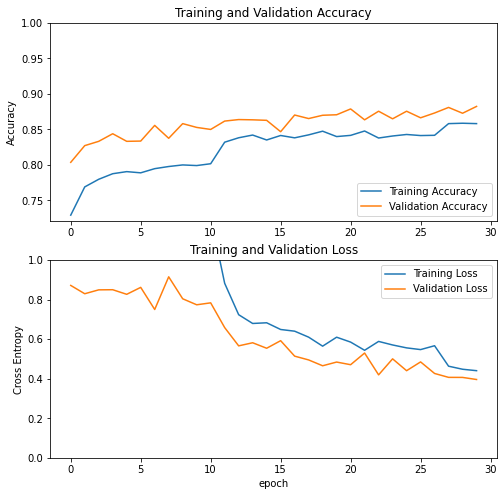

In [79]:
acc = history_b7.history['accuracy']
val_acc = history_b7.history['val_accuracy']

loss = history_b7.history['loss']
val_loss = history_b7.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [82]:
# Confussion matrix 1st case with ImageDataGen only
y_test = test_generator.classes
y_pred_b7 = model_b7.predict(test_generator)
y_pred_b7 = np.argmax(y_pred_b7,axis=1)


#Rresult with ImageDataGen only
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test,y_pred_b7,target_names = labels))


300/300 [==============================] - 31s 102ms/step
              precision    recall  f1-score   support

   buildings       0.92      0.88      0.90       437
      forest       0.99      0.99      0.99       474
     glacier       0.83      0.85      0.84       553
    mountain       0.87      0.81      0.84       525
         sea       0.94      0.96      0.95       510
      street       0.90      0.95      0.92       501

    accuracy                           0.91      3000
   macro avg       0.91      0.91      0.91      3000
weighted avg       0.90      0.91      0.90      3000



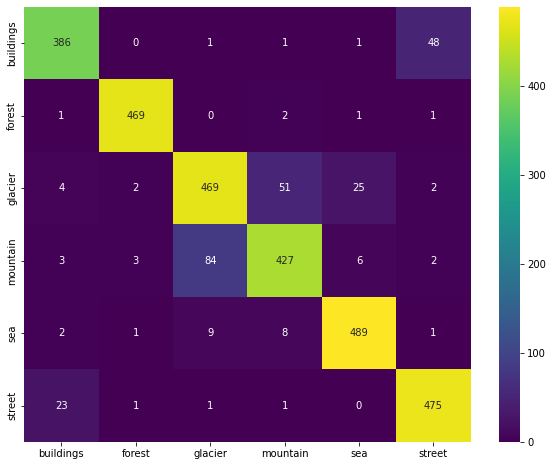

In [83]:
#CF with ImageDataGen only
import seaborn as sns
plt.figure(figsize=(10,8))
sns.heatmap(confusion_matrix(y_test,y_pred_b7),annot=True,fmt='.3g',xticklabels=labels,yticklabels=labels,cmap='viridis')
plt.title()
plt.show()

# Error Analysis 

In [32]:
## Load Model from ALL 

#Load MobilenetV2
path_mobile = "../model/model_mobile.h5"
model_mob = tf.keras.models.load_model(path_mobile)

#Load Efficienet-B0
path_b0 = '../model/model_b0.h5' 
model_b0 = tf.keras.models.load_model(path_b0)

#Load Efficienet-B7
path_b7 = '../model/model_b7.h5'
model_b7 = tf.keras.models.load_model(path_b7)


In [4]:
# make predict
def scan_dir(mypath):
    file_name = []
    folder_name = []
    full_path = []
    for path, subdirs, files in os.walk(mypath):
        folder = path.split('/')[-1].lower()
        for name in files:
            full_path.append(os.path.join(path + '/' +  name)) #Full path join from mypath+name of the image
            folder_name.append(path.split('/')[-1].lower()) #Gather from spliting the full path       
            file_name.append(f"{folder}_{name}")
    return full_path, folder_name , file_name

In [5]:
#Build df 

full_path,tag,file_name = scan_dir(test_path)

# create Dataframe consist of path that are gonna be predict
df = pd.DataFrame({"path":full_path,'file_name':file_name,"label":tag})
df.groupby(['label']).size()

label
buildings    437
forest       474
glacier      553
mountain     525
sea          510
street       501
dtype: int64

In [6]:
df

,path,file_name,label
0,../data/seg_test/buildings/20057.jpg,buildings_20057.jpg,buildings
1,../data/seg_test/buildings/20060.jpg,buildings_20060.jpg,buildings
2,../data/seg_test/buildings/20061.jpg,buildings_20061.jpg,buildings
3,../data/seg_test/buildings/20064.jpg,buildings_20064.jpg,buildings
4,../data/seg_test/buildings/20073.jpg,buildings_20073.jpg,buildings
...,...,...,...
2995,../data/seg_test/street/24292.jpg,street_24292.jpg,street
2996,../data/seg_test/street/24300.jpg,street_24300.jpg,street
2997,../data/seg_test/street/24315.jpg,street_24315.jpg,street
2998,../data/seg_test/street/24317.jpg,street_24317.jpg,street


In [16]:
# %cd image_classification_project 
from common.config import get_config
os.getcwd()

c:\Users\Grisdy\Documents\project_grisdy\image_classification_project


'c:\\Users\\Grisdy\\Documents\\project_grisdy\\image_classification_project'

In [21]:
conf = get_config()

dims = conf['image']['dim']
dims

[224, 224]

In [25]:
with open("src/labels.pkl", 'rb') as f:
    labels = pickle.load(f)

[*labels][1]

'forest'

In [39]:
import PIL.Image

def preprocess(img):
    nimg = img.convert('RGB').resize(dim, resample= 0)
    # nimg = img.convert('RGB')

    # nimg = img.resize(dim, resample= 0)
    
    img_arr = (np.array(nimg,dtype=np.float32))/255
    img_arr = img_arr.reshape(1, dim[0], dim[1], channel[0])
    return img_arr

def get_imgs(path):
    if os.path.exists(path):
        im = PIL.Image.open(path)
        # im.show()
        im = preprocess(im)
        
        return im


In [46]:
# ../data/seg_pred/3.jp
X = get_imgs("../data/seg_pred/3.jpg")
# X = get_imgs(df["path"][0])


y = model_b0.predict(X)
y = y.flatten() # make it into 1 dimension array
y_prob = np.max(y)


top_k_prob, top_k_class = tf.nn.top_k(y, k=2)

top_k_prob, top_k_class

1/1 [==============================] - 0s 22ms/step


(<tf.Tensor: shape=(2,), dtype=float32, numpy=array([9.999459e-01, 5.413433e-05], dtype=float32)>,
 <tf.Tensor: shape=(2,), dtype=int32, numpy=array([5, 0])>)

In [50]:
for l, x in zip(top_k_prob,top_k_class):
    print ([*labels][x])
    print (l *100 )

street
tf.Tensor(99.99459, shape=(), dtype=float32)
buildings
tf.Tensor(0.005413433, shape=(), dtype=float32)


In [26]:
er = pd.read_csv("../error_analysis.csv")
er

,path,file_name,label,predicted_label_mobile,predicted_prob_mobile,predicted_proba_mobile,predicted_label_b0,predicted_prob_b0,predicted_proba_b0,predicted_label_b7,predicted_prob_b7,predicted_proba_b7
0,../data/seg_test/buildings/20057.jpg,buildings_20057.jpg,buildings,buildings,0.999999,[9.9999917e-01 2.7366943e-12 6.3671030e-10 7.2...,buildings,0.999999,[9.9999917e-01 1.6372604e-18 4.9817236e-13 3.4...,buildings,0.999999,[9.9999917e-01 6.8806402e-12 1.0271893e-11 1.2...
1,../data/seg_test/buildings/20060.jpg,buildings_20060.jpg,buildings,buildings,0.992342,[9.9234188e-01 7.2201507e-12 6.8060411e-09 1.9...,buildings,0.994914,[9.9491358e-01 3.0902795e-13 1.3511639e-07 1.1...,buildings,0.999947,[9.9994683e-01 1.9274426e-13 5.6074264e-13 3.6...
2,../data/seg_test/buildings/20061.jpg,buildings_20061.jpg,buildings,buildings,0.999935,[9.9993479e-01 2.3669635e-08 1.3758078e-09 1.6...,buildings,0.993968,[9.9396801e-01 3.6143445e-14 2.5236471e-07 6.1...,buildings,0.999897,[9.99896646e-01 8.27035107e-10 1.76576140e-08 ...
3,../data/seg_test/buildings/20064.jpg,buildings_20064.jpg,buildings,buildings,0.998592,[9.9859244e-01 3.9559262e-11 2.3834559e-09 1.3...,buildings,0.999760,[9.9975985e-01 1.5797521e-15 1.0763198e-11 1.4...,buildings,0.999995,[9.9999464e-01 4.2878715e-14 1.5573320e-12 2.7...
4,../data/seg_test/buildings/20073.jpg,buildings_20073.jpg,buildings,buildings,0.997637,[9.9763727e-01 4.0488043e-08 3.5168839e-06 1.0...,buildings,0.998579,[9.9857903e-01 1.7974547e-07 1.2943427e-06 9.0...,buildings,0.999911,[9.9991047e-01 1.6481755e-10 1.0552378e-06 2.6...
...,...,...,...,...,...,...,...,...,...,...,...,...
2995,../data/seg_test/street/24292.jpg,street_24292.jpg,street,street,0.527098,[4.7290227e-01 2.3083639e-10 3.3354648e-09 2.7...,street,0.999499,[5.0068746e-04 3.1579294e-15 1.1930695e-12 4.4...,street,0.996632,[3.3680801e-03 7.0578001e-17 1.7017806e-16 4.7...
2996,../data/seg_test/street/24300.jpg,street_24300.jpg,street,street,0.999966,[3.38666505e-05 7.81191247e-14 1.09162945e-08 ...,street,0.999944,[5.5820801e-05 1.1246321e-15 4.3750793e-12 2.6...,street,0.999244,[7.5560366e-04 7.9001874e-15 7.4817409e-12 7.5...
2997,../data/seg_test/street/24315.jpg,street_24315.jpg,street,street,0.981077,[4.5098609e-04 1.1209915e-03 8.1713626e-04 5.5...,street,0.997212,[2.1568377e-04 2.4249957e-06 5.8665569e-04 4.1...,street,0.993126,[2.5124333e-05 1.8655226e-09 2.0531508e-04 6.5...
2998,../data/seg_test/street/24317.jpg,street_24317.jpg,street,buildings,0.534598,[5.3459853e-01 1.2188201e-13 1.0490724e-06 2.0...,street,0.999713,[2.8659758e-04 4.9339174e-15 1.2979740e-07 1.6...,street,0.999737,[2.6330588e-04 1.4268383e-15 7.1870072e-11 3.9...


In [44]:
np.argmax(er["predicted_proba_b0"][2699])
er["predicted_proba_b0"][2699]


'[1.9656439e-07 5.1048574e-16 7.3469946e-06 2.7265485e-06 4.5495856e-09\n 9.9998975e-01]'

In [17]:
uri = df["path"][1320]

X = get_imgs(uri)
y = model_b0.predict(X)
y_prob = np.max(y)

1/1 [==============================] - 0s 19ms/step


In [19]:
y.flatten()

array([3.8563754e-04, 1.1671311e-03, 3.2152354e-03, 6.6889924e-01,
       3.2590407e-01, 4.2865839e-04], dtype=float32)

In [ ]:
top_k_values, top_k_indices = tf.nn.top_k(y, k=3)
top_k_values, top_k_indices

(<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[0.6688995 , 0.3259039 , 0.00321523]], dtype=float32)>,
 <tf.Tensor: shape=(1, 3), dtype=int32, numpy=array([[3, 4, 2]])>)

In [ ]:
# make it into pure list 
top_k_values.numpy().flatten()

array([0.6688995 , 0.3259039 , 0.00321523], dtype=float32)

In [ ]:
np.max(y)

0.6688995

In [21]:
# Predict the Data 

def predict_data(data, model, model_name):
    detected_label = []
    predicted_label_prob = []
    predicted_proba = []

    for index, row in data.iterrows():
        try:
            url = row['path']
            X = get_imgs(url)
            y = model.predict(X)
            y = y.flatten() # make it into 1 dimension array
            y_prob = np.max(y)

            #get the detected label of the actual data
            #argmax for see the position of the label that have highest prob
            detected_label.append([*labels][np.argmax(y)]) #this getting the label from highest predicted prob

            #get the predicted label 
            predicted_label_prob.append(y_prob)
            predicted_proba.append(y)
        
        except:
            detected_label.append('Fail')
            predicted_label_prob.append(0)
            predicted_proba.append(None)
            
    data[f'predicted_label_{model_name}'] = detected_label
    data[f'predicted_prob_{model_name}'] = predicted_label_prob
    data[f'predicted_proba_{model_name}'] = predicted_proba




In [23]:
# Append the prediction to the df of test data

# Predict with MobileNet-V2
predict_data(df, model_mob, "mobile")

# Predict with Efficienet-B0
predict_data(df, model_b0, "b0")

# Predict with Efficienet-B0
predict_data(df, model_b7, "b7")

1/1 [==============================] - 0s 27ms/step


In [24]:
#Save error analysisi data
df.to_csv('../error_analysis.csv', index=False)

In [25]:
#load analysis data
df = pd.read_csv('../error_analysis.csv')
df

,path,file_name,label,predicted_label_mobile,predicted_prob_mobile,predicted_proba_mobile,predicted_label_b0,predicted_prob_b0,predicted_proba_b0,predicted_label_b7,predicted_prob_b7,predicted_proba_b7
0,../data/seg_test/buildings/20057.jpg,buildings_20057.jpg,buildings,buildings,0.999999,[9.9999917e-01 2.7366943e-12 6.3671030e-10 7.2...,buildings,0.999999,[9.9999917e-01 1.6372604e-18 4.9817236e-13 3.4...,buildings,0.999999,[9.9999917e-01 6.8806402e-12 1.0271893e-11 1.2...
1,../data/seg_test/buildings/20060.jpg,buildings_20060.jpg,buildings,buildings,0.992342,[9.9234188e-01 7.2201507e-12 6.8060411e-09 1.9...,buildings,0.994914,[9.9491358e-01 3.0902795e-13 1.3511639e-07 1.1...,buildings,0.999947,[9.9994683e-01 1.9274426e-13 5.6074264e-13 3.6...
2,../data/seg_test/buildings/20061.jpg,buildings_20061.jpg,buildings,buildings,0.999935,[9.9993479e-01 2.3669635e-08 1.3758078e-09 1.6...,buildings,0.993968,[9.9396801e-01 3.6143445e-14 2.5236471e-07 6.1...,buildings,0.999897,[9.99896646e-01 8.27035107e-10 1.76576140e-08 ...
3,../data/seg_test/buildings/20064.jpg,buildings_20064.jpg,buildings,buildings,0.998592,[9.9859244e-01 3.9559262e-11 2.3834559e-09 1.3...,buildings,0.999760,[9.9975985e-01 1.5797521e-15 1.0763198e-11 1.4...,buildings,0.999995,[9.9999464e-01 4.2878715e-14 1.5573320e-12 2.7...
4,../data/seg_test/buildings/20073.jpg,buildings_20073.jpg,buildings,buildings,0.997637,[9.9763727e-01 4.0488043e-08 3.5168839e-06 1.0...,buildings,0.998579,[9.9857903e-01 1.7974547e-07 1.2943427e-06 9.0...,buildings,0.999911,[9.9991047e-01 1.6481755e-10 1.0552378e-06 2.6...
...,...,...,...,...,...,...,...,...,...,...,...,...
2995,../data/seg_test/street/24292.jpg,street_24292.jpg,street,street,0.527098,[4.7290227e-01 2.3083639e-10 3.3354648e-09 2.7...,street,0.999499,[5.0068746e-04 3.1579294e-15 1.1930695e-12 4.4...,street,0.996632,[3.3680801e-03 7.0578001e-17 1.7017806e-16 4.7...
2996,../data/seg_test/street/24300.jpg,street_24300.jpg,street,street,0.999966,[3.38666505e-05 7.81191247e-14 1.09162945e-08 ...,street,0.999944,[5.5820801e-05 1.1246321e-15 4.3750793e-12 2.6...,street,0.999244,[7.5560366e-04 7.9001874e-15 7.4817409e-12 7.5...
2997,../data/seg_test/street/24315.jpg,street_24315.jpg,street,street,0.981077,[4.5098609e-04 1.1209915e-03 8.1713626e-04 5.5...,street,0.997212,[2.1568377e-04 2.4249957e-06 5.8665569e-04 4.1...,street,0.993126,[2.5124333e-05 1.8655226e-09 2.0531508e-04 6.5...
2998,../data/seg_test/street/24317.jpg,street_24317.jpg,street,buildings,0.534598,[5.3459853e-01 1.2188201e-13 1.0490724e-06 2.0...,street,0.999713,[2.8659758e-04 4.9339174e-15 1.2979740e-07 1.6...,street,0.999737,[2.6330588e-04 1.4268383e-15 7.1870072e-11 3.9...


In [193]:
# Error predicted  result

#Err data for mobile
err_b7 = df.loc[(df['label']!=df['predicted_label_mobile'])].reset_index().copy()

#Err data for b0
err_b0 = df.loc[(df['label']!=df['predicted_label_b0'])].reset_index().copy()

#Err data for b7
err_b7 = df.loc[(df['label']!=df['predicted_label_b7'])].reset_index().copy()

## Error analysis MobileNetV2

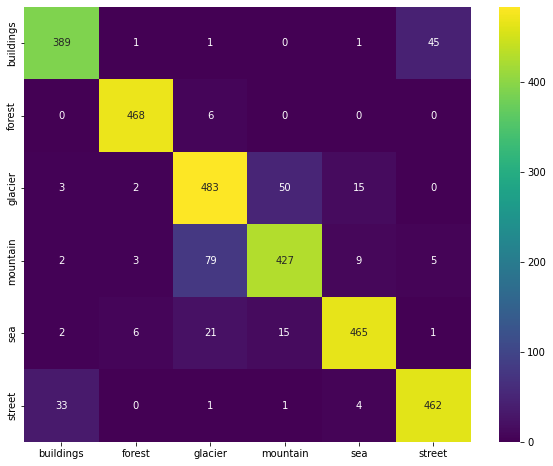

In [ ]:
#CM with From DataGen  
import seaborn as sns
plt.figure(figsize=(10,8))
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='.3g',xticklabels=labels,yticklabels=labels,cmap='viridis')
plt.show()

In [206]:
err_b7.sort_values('predicted_prob_mobile', ascending=False, ignore_index=True, inplace=True)
err_b7

,index,path,file_name,label,predicted_label_mobile,predicted_prob_mobile,predicted_proba_mobile,predicted_label_b0,predicted_prob_b0,predicted_proba_b0,predicted_label_b7,predicted_prob_b7,predicted_proba_b7
0,195,../data/seg_test/buildings/21929.jpg,buildings_21929.jpg,buildings,street,0.999665,[[3.3503983e-04 2.8433327e-13 1.8355951e-08 5....,buildings,0.967385,[[9.6738464e-01 4.4936231e-18 1.2254188e-09 8....,street,0.770175,[[2.2982542e-01 3.5001923e-19 3.8758878e-16 3....
1,979,../data/seg_test/glacier/20567.jpg,glacier_20567.jpg,glacier,sea,0.999619,[[2.3785931e-06 4.0664318e-08 1.2404201e-04 2....,sea,0.999275,[[4.6980412e-07 2.1820643e-11 7.1739964e-04 7....,sea,0.997127,[[7.5254667e-07 3.1687129e-11 1.3121866e-03 1....
2,2701,../data/seg_test/street/21694.jpg,street_21694.jpg,street,buildings,0.999479,[[9.9947864e-01 5.3531953e-11 2.6098277e-09 1....,buildings,0.990796,[[9.9079567e-01 3.6278655e-19 5.5121530e-14 2....,buildings,0.994670,[[9.9466962e-01 1.0316532e-14 2.3762318e-12 8....
3,1294,../data/seg_test/glacier/23027.jpg,glacier_23027.jpg,glacier,sea,0.999149,[[5.4936877e-06 5.7925797e-07 7.0031331e-04 1....,sea,0.994429,[[3.3999811e-05 1.7978507e-04 4.0979367e-03 1....,sea,0.987690,[[1.41739895e-06 2.58704836e-06 1.04047395e-02...
4,88,../data/seg_test/buildings/20846.jpg,buildings_20846.jpg,buildings,street,0.998507,[[1.4912768e-03 8.0257109e-08 3.6498668e-07 1....,street,0.999966,[[3.4457476e-05 7.0737701e-16 1.7216129e-09 2....,street,0.999956,[[2.5758325e-05 3.9358174e-08 1.7607397e-05 5....
...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,1608,../data/seg_test/mountain/21301.jpg,mountain_21301.jpg,mountain,sea,0.426724,[[4.3244748e-07 8.2367824e-06 2.0912783e-01 3....,mountain,0.900124,[[1.7744330e-06 5.1154427e-07 6.5709248e-02 9....,mountain,0.973688,[[4.1438697e-10 2.0189897e-11 2.5778092e-02 9....
302,2483,../data/seg_test/sea/24201.jpg,sea_24201.jpg,sea,mountain,0.423190,[[7.8326684e-06 1.4722729e-04 1.6694337e-01 4....,sea,0.993785,[[3.6081699e-10 2.1846913e-10 9.2339388e-04 5....,sea,0.999575,[[6.87521833e-07 1.07921105e-09 3.08037794e-04...
303,2001,../data/seg_test/sea/20165.jpg,sea_20165.jpg,sea,buildings,0.404464,[[4.0446445e-01 1.1247992e-02 1.2050049e-01 2....,street,0.645566,[[2.53979000e-04 5.00721349e-08 1.22966585e-05...,street,0.459973,[[2.80919790e-01 2.96544837e-11 1.09360546e-01...
304,2430,../data/seg_test/sea/23851.jpg,sea_23851.jpg,sea,glacier,0.384880,[[3.7826726e-07 5.2553522e-09 3.8488024e-01 2....,sea,0.997560,[[4.8007973e-07 3.2153596e-11 1.3459483e-04 2....,sea,0.757037,[[6.2210471e-05 3.8977100e-06 1.6684815e-01 7....


In [225]:
err_b7[10:20]

,index,path,file_name,label,predicted_label_mobile,predicted_prob_mobile,predicted_proba_mobile,predicted_label_b0,predicted_prob_b0,predicted_proba_b0,predicted_label_b7,predicted_prob_b7,predicted_proba_b7
10,1308,../data/seg_test/glacier/23169.jpg,glacier_23169.jpg,glacier,glacier,0.915529,[[1.6384968e-04 1.4763859e-03 9.1552854e-01 6....,mountain,0.924439,[[4.9535098e-04 1.6691115e-03 2.1710034e-02 9....,mountain,0.998659,[[1.4080321e-07 4.9791660e-04 7.8662101e-04 9....
11,1346,../data/seg_test/glacier/23497.jpg,glacier_23497.jpg,glacier,mountain,0.954533,[[1.5402857e-07 1.4663090e-04 4.5058198e-02 9....,mountain,0.982641,[[4.2197548e-06 5.0520975e-07 1.3084996e-02 9....,mountain,0.998603,[[1.9591875e-10 1.4727068e-06 1.3952513e-03 9....
12,1470,../data/seg_test/mountain/20116.jpg,mountain_20116.jpg,mountain,glacier,0.907434,[[6.8633361e-09 3.5946583e-11 9.0743417e-01 9....,glacier,0.937178,[[2.0502766e-05 3.6339486e-08 9.3717843e-01 6....,glacier,0.998508,[[1.6533635e-07 2.1885141e-10 9.9850756e-01 1....
13,1715,../data/seg_test/mountain/22124.jpg,mountain_22124.jpg,mountain,glacier,0.907610,[[5.4806861e-07 3.0771036e-10 9.0761036e-01 9....,glacier,0.757528,[[9.5228570e-06 1.3819680e-08 7.5752777e-01 2....,glacier,0.998323,[[5.6213212e-10 3.7197967e-11 9.9832267e-01 1....
14,186,../data/seg_test/buildings/21789.jpg,buildings_21789.jpg,buildings,buildings,0.636686,[[0.6366856 0.18224712 0.00717459 0.02912058 ...,buildings,0.873384,[[8.7338412e-01 2.4622889e-06 4.2817825e-03 4....,sea,0.998256,[[4.2965580e-04 1.3610026e-10 1.1707229e-03 1....
15,1734,../data/seg_test/mountain/22205.jpg,mountain_22205.jpg,mountain,glacier,0.908311,[[3.3456413e-08 1.5034336e-10 9.0831077e-01 8....,glacier,0.984025,[[1.1739048e-06 7.5105716e-10 9.8402458e-01 1....,glacier,0.997946,[[1.2133040e-08 3.7088225e-11 9.9794561e-01 1....
16,34,../data/seg_test/buildings/20425.jpg,buildings_20425.jpg,buildings,buildings,0.949541,[[9.4954079e-01 9.9337910e-08 1.9374934e-04 5....,buildings,0.699733,[[6.9973326e-01 3.6671186e-10 4.6048405e-07 3....,street,0.997731,[[2.2686571e-03 5.7196928e-13 1.9519348e-09 3....
17,153,../data/seg_test/buildings/21506.jpg,buildings_21506.jpg,buildings,street,0.972234,[[2.7723562e-02 2.9370498e-10 2.9983603e-05 1....,buildings,0.595175,[[5.9517509e-01 2.4542780e-16 2.4783541e-08 1....,street,0.997315,[[2.6853061e-03 6.9241813e-17 2.2945800e-11 5....
18,338,../data/seg_test/buildings/23322.jpg,buildings_23322.jpg,buildings,buildings,0.998490,[[9.9848998e-01 1.1849039e-08 6.5591189e-07 5....,buildings,0.567019,[[5.6701869e-01 1.8190661e-10 5.6209469e-06 4....,street,0.997209,[[2.79142032e-03 2.77396297e-13 6.40888644e-12...
19,979,../data/seg_test/glacier/20567.jpg,glacier_20567.jpg,glacier,sea,0.999619,[[2.3785931e-06 4.0664318e-08 1.2404201e-04 2....,sea,0.999275,[[4.6980412e-07 2.1820643e-11 7.1739964e-04 7....,sea,0.997127,[[7.5254667e-07 3.1687129e-11 1.3121866e-03 1....


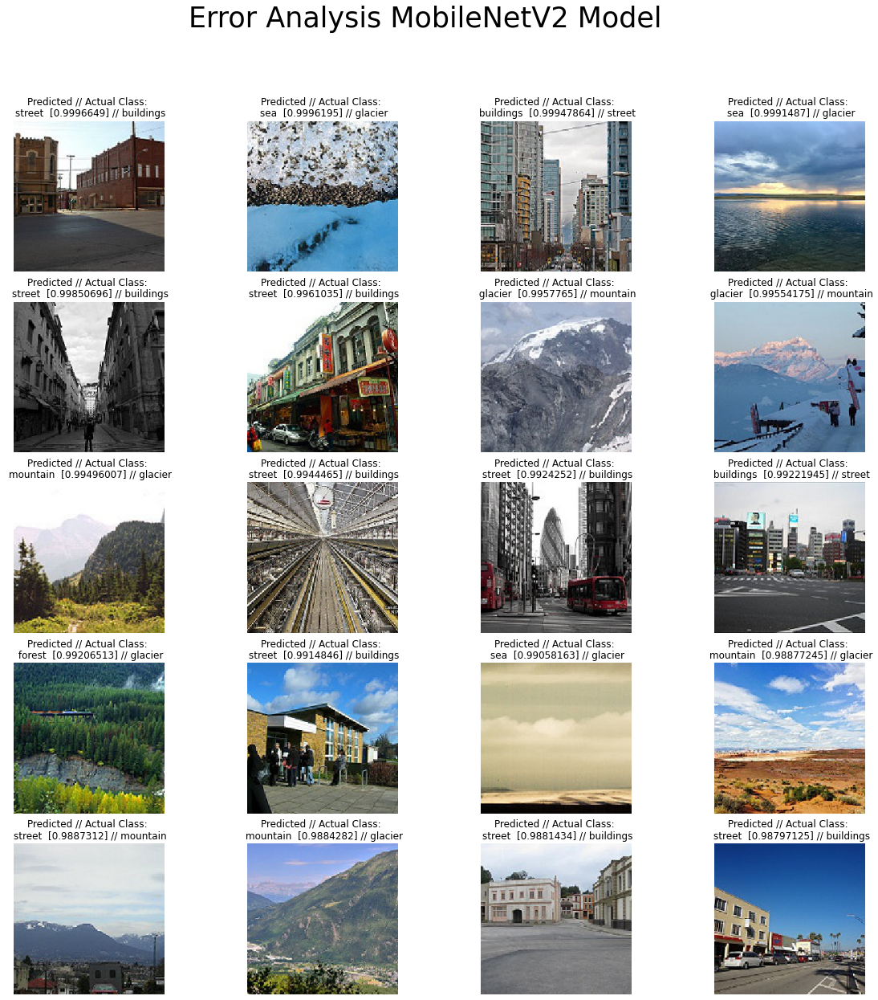

In [226]:
from tensorflow.keras.preprocessing import image

plt.figure(figsize = (20 , 20))
plt.suptitle('Error Analysis MobileNetV2 Model', fontsize =35)



for i in range(20):
    plt.subplot(5, 4, i+1) #(baris, jumlah kolom, iterasi tiap gambar)
    img = image.load_img(err_mobile['path'].loc[i],target_size=dim)
    plt.imshow(img)
    plt.title(
        f"Predicted // Actual Class: \n {err_mobile['predicted_label_mobile'][i]}  [{err_mobile['predicted_prob_mobile'][i]}] // {err_mobile['label'].loc[i]}"       
        )
    plt.axis("off")


Text(0.5, 1.0, 'Predicted // Actual Class: \n mountain  [0.98877245] // glacier')

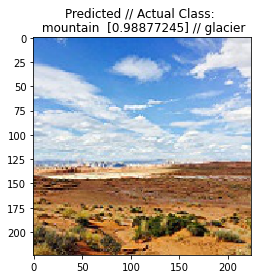

In [231]:
img = image.load_img(err_mobile['path'].loc[15],target_size=dim)
plt.imshow(img)
plt.title(
    f"Predicted // Actual Class: \n {err_mobile['predicted_label_mobile'][15]}  [{err_mobile['predicted_prob_mobile'][15]}] // {err_mobile['label'].loc[15]}"       
    )

Text(0.5, 1.0, 'Predicted // Actual Class: \n mountain  [0.9884282] // glacier')

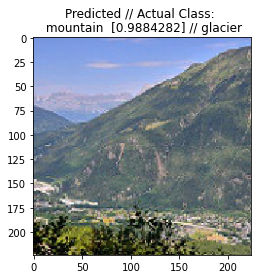

In [232]:
img = image.load_img(err_mobile['path'].loc[17],target_size=dim)
plt.imshow(img)
plt.title(
    f"Predicted // Actual Class: \n {err_mobile['predicted_label_mobile'][17]}  [{err_mobile['predicted_prob_mobile'][17]}] // {err_mobile['label'].loc[17]}"       
    )

From the error analysis above we can find that:
- Most of the wrong prediction with the highest probablity are street and building
- There is some error on several image label like 2 sampel above  
- This model Produced accuracy 90% on test data set

## Error analysis Efficienet-B0

In [213]:
#See the 
err_b0.sort_values('predicted_prob_b0', ascending=False, inplace=True, ignore_index=True)
err_b0.head(20)

,index,path,file_name,label,predicted_label_mobile,predicted_prob_mobile,predicted_proba_mobile,predicted_label_b0,predicted_prob_b0,predicted_proba_b0,predicted_label_b7,predicted_prob_b7,predicted_proba_b7
0,81,../data/seg_test/buildings/20777.jpg,buildings_20777.jpg,buildings,street,0.994447,[[5.5291350e-03 2.2734197e-05 1.2868170e-06 3....,street,0.999995,[[4.5722905e-07 4.1269782e-06 4.4905107e-10 4....,street,0.984437,[[1.5562907e-02 2.7476460e-08 9.0376471e-09 8....
1,88,../data/seg_test/buildings/20846.jpg,buildings_20846.jpg,buildings,street,0.998507,[[1.4912768e-03 8.0257109e-08 3.6498668e-07 1....,street,0.999966,[[3.4457476e-05 7.0737701e-16 1.7216129e-09 2....,street,0.999956,[[2.5758325e-05 3.9358174e-08 1.7607397e-05 5....
2,1498,../data/seg_test/mountain/20378.jpg,mountain_20378.jpg,mountain,street,0.933543,[[2.4289021e-02 4.0974684e-02 1.1577175e-03 2....,street,0.999952,[[1.9687472e-05 2.0888982e-07 2.8436065e-05 2....,street,0.986995,[[1.3000943e-02 4.0539662e-06 2.6731689e-07 2....
3,1750,../data/seg_test/mountain/22279.jpg,mountain_22279.jpg,mountain,glacier,0.843042,[[1.6268499e-06 4.6431475e-10 8.4304154e-01 1....,glacier,0.999761,[[8.4565445e-11 1.5877615e-12 9.9976104e-01 2....,glacier,0.753304,[[3.7448819e-10 2.5519396e-08 7.5330400e-01 2....
4,434,../data/seg_test/buildings/24290.jpg,buildings_24290.jpg,buildings,street,0.992425,[[7.5726109e-03 7.7144662e-08 2.1131470e-06 9....,street,0.999740,[[2.6024302e-04 1.8301018e-14 1.7082243e-12 5....,street,0.913814,[[8.6186379e-02 2.7793368e-11 5.2748382e-11 6....
5,1282,../data/seg_test/glacier/22943.jpg,glacier_22943.jpg,glacier,sea,0.968177,[[2.0355942e-06 1.6197274e-04 2.7330719e-02 4....,sea,0.999324,[[3.5432507e-07 4.1799177e-07 6.2779663e-04 4....,sea,0.987370,[[1.0915381e-06 7.6838119e-11 1.1425557e-02 1....
6,979,../data/seg_test/glacier/20567.jpg,glacier_20567.jpg,glacier,sea,0.999619,[[2.3785931e-06 4.0664318e-08 1.2404201e-04 2....,sea,0.999275,[[4.6980412e-07 2.1820643e-11 7.1739964e-04 7....,sea,0.997127,[[7.5254667e-07 3.1687129e-11 1.3121866e-03 1....
7,1074,../data/seg_test/glacier/21304.jpg,glacier_21304.jpg,glacier,glacier,0.734606,[[1.3769006e-03 3.8603444e-05 7.3460615e-01 1....,sea,0.999261,[[2.2713328e-04 4.7647009e-07 3.1959586e-04 2....,glacier,0.923976,[[3.3167887e-03 1.1848220e-02 9.2397618e-01 1....
8,269,../data/seg_test/buildings/22598.jpg,buildings_22598.jpg,buildings,street,0.756644,[[2.4335553e-01 1.1850565e-11 7.8685495e-08 2....,street,0.999237,[[7.6335634e-04 2.5102880e-16 3.3464450e-11 4....,street,0.980517,[[1.9483084e-02 8.1227541e-17 5.6555251e-14 5....
9,2780,../data/seg_test/street/22387.jpg,street_22387.jpg,street,street,0.855487,[[9.89921615e-02 5.32750580e-11 1.26943765e-02...,buildings,0.998870,[[9.9887007e-01 1.8907209e-14 2.0354542e-05 1....,street,0.978749,[[2.1080229e-02 5.4648434e-12 1.0467924e-06 1....


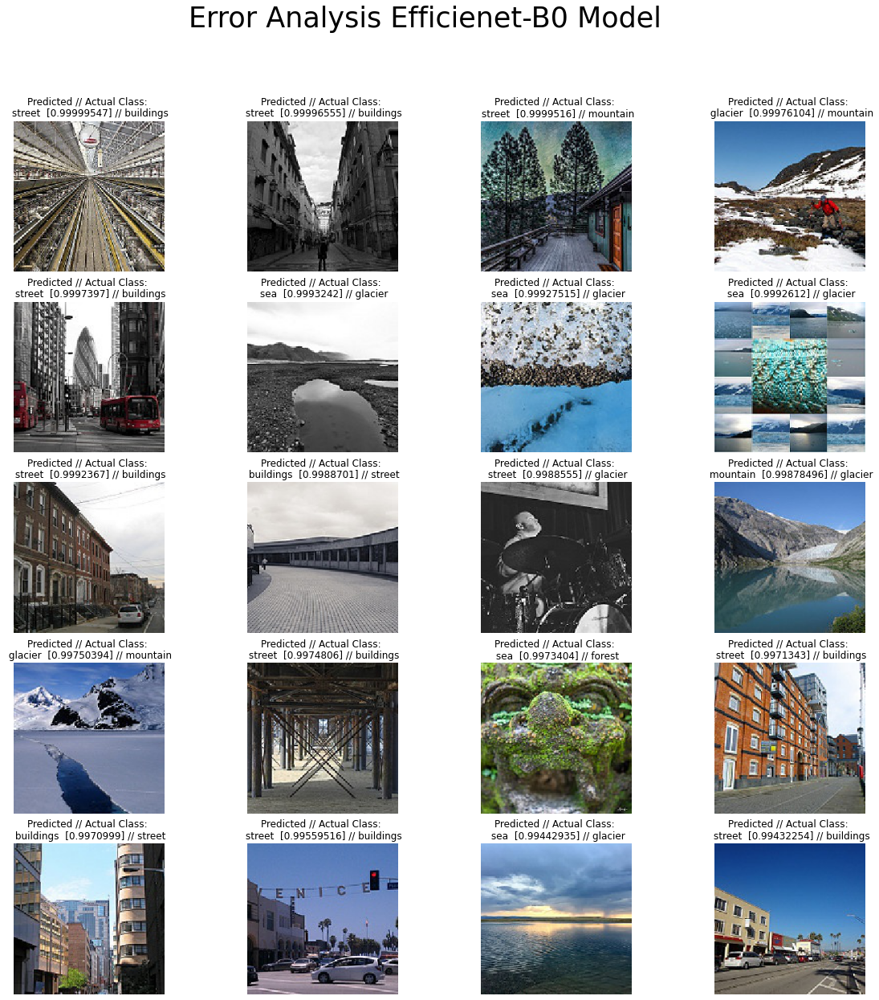

In [215]:
from tensorflow.keras.preprocessing import image

plt.figure(figsize = (20 , 20))
plt.suptitle('Error Analysis Efficienet-B0 Model', fontsize =35)



for i in range(20):
    plt.subplot(5, 4, i+1) #(baris, jumlah kolom, iterasi tiap gambar)
    img = image.load_img(err_b0['path'].loc[i],target_size=dim)
    plt.imshow(img)
    plt.title(
        f"Predicted // Actual Class: \n {err_b0['predicted_label_b0'][i]}  [{err_b0['predicted_prob_b0'][i]}] // {err_b0['label'].loc[i]}"       
        )
    plt.axis("off")


## Error analysis Efficienet-B7

In [220]:
#See the 
err_b7.sort_values('predicted_prob_b7', ascending=False, inplace=True, ignore_index=True)
err_b7.head(20)

,index,path,file_name,label,predicted_label_mobile,predicted_prob_mobile,predicted_proba_mobile,predicted_label_b0,predicted_prob_b0,predicted_proba_b0,predicted_label_b7,predicted_prob_b7,predicted_proba_b7
0,205,../data/seg_test/buildings/22031.jpg,buildings_22031.jpg,buildings,street,0.987971,[[1.2000927e-02 1.2684793e-10 2.7382193e-05 1....,street,0.994323,[[5.6774318e-03 3.3094351e-18 6.6140503e-11 1....,street,1.000000,[[5.1802107e-07 3.1331928e-20 3.5189766e-12 1....
1,131,../data/seg_test/buildings/21294.jpg,buildings_21294.jpg,buildings,street,0.991485,[[8.4659457e-03 3.5352155e-11 4.5508245e-05 1....,street,0.615451,[[3.8454899e-01 8.0397614e-15 4.8037819e-08 9....,street,0.999988,[[1.0649260e-05 3.0875007e-13 5.2587581e-07 4....
2,88,../data/seg_test/buildings/20846.jpg,buildings_20846.jpg,buildings,street,0.998507,[[1.4912768e-03 8.0257109e-08 3.6498668e-07 1....,street,0.999966,[[3.4457476e-05 7.0737701e-16 1.7216129e-09 2....,street,0.999956,[[2.5758325e-05 3.9358174e-08 1.7607397e-05 5....
3,1319,../data/seg_test/glacier/23272.jpg,glacier_23272.jpg,glacier,sea,0.823456,[[2.8008761e-04 2.2176857e-05 1.6897504e-01 7....,sea,0.985088,[[1.3245489e-06 1.8627953e-06 1.4898427e-02 7....,sea,0.999934,[[2.3669426e-07 3.3325901e-07 5.9866954e-05 5....
4,1392,../data/seg_test/glacier/23819.jpg,glacier_23819.jpg,glacier,glacier,0.642219,[[2.7852029e-02 2.9249188e-01 6.4221859e-01 3....,glacier,0.702461,[[2.3021085e-08 3.4608531e-03 7.0246124e-01 7....,forest,0.999882,[[1.3302675e-06 9.9988163e-01 1.2874037e-07 6....
5,1495,../data/seg_test/mountain/20356.jpg,mountain_20356.jpg,mountain,glacier,0.946157,[[3.6605916e-06 4.7595500e-10 9.4615680e-01 5....,glacier,0.874405,[[2.59647582e-04 7.33681258e-12 8.74404490e-01...,glacier,0.999749,[[1.1461379e-06 6.1836786e-12 9.9974912e-01 2....
6,86,../data/seg_test/buildings/20826.jpg,buildings_20826.jpg,buildings,buildings,0.698368,[[6.9836807e-01 9.5402919e-10 4.8069015e-08 7....,buildings,0.556427,[[5.5642724e-01 1.0356492e-13 1.1570478e-10 1....,street,0.999583,[[4.1699686e-04 2.4344811e-14 1.5570852e-13 1....
7,1930,../data/seg_test/mountain/23780.jpg,mountain_23780.jpg,mountain,mountain,0.670453,[[1.1542735e-07 1.5083290e-09 3.2870692e-01 6....,glacier,0.922078,[[7.3951683e-06 6.7147425e-08 9.2207754e-01 4....,glacier,0.999457,[[2.3160749e-09 1.8661591e-12 9.9945694e-01 2....
8,1108,../data/seg_test/glacier/21559.jpg,glacier_21559.jpg,glacier,buildings,0.658869,[[6.5886950e-01 1.2253129e-06 2.1984700e-02 3....,street,0.988395,[[0.00135402 0.00114908 0.00109413 0.00274437 ...,street,0.999078,[[2.5964919e-05 8.9278049e-04 6.9194039e-07 2....
9,1324,../data/seg_test/glacier/23314.jpg,glacier_23314.jpg,glacier,glacier,0.905964,[[8.1416265e-06 3.7770747e-07 9.0596354e-01 4....,street,0.998856,[[1.3430907e-04 3.3485537e-06 6.3141703e-04 1....,street,0.999019,[[7.0842209e-05 3.9761315e-05 7.9421117e-04 4....


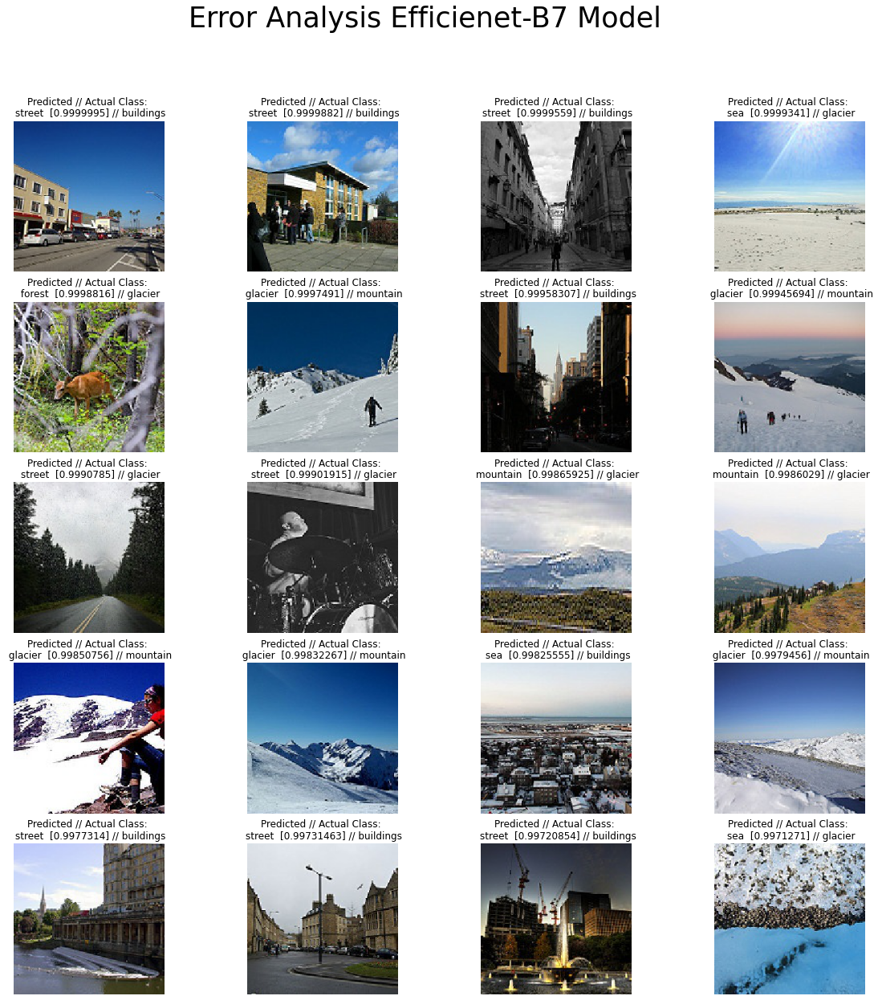

In [221]:
from tensorflow.keras.preprocessing import image

plt.figure(figsize = (20 , 20))
plt.suptitle('Error Analysis Efficienet-B7 Model', fontsize =35)


for i in range(20):
    plt.subplot(5, 4, i+1) #(baris, jumlah kolom, iterasi tiap gambar)
    img = image.load_img(err_b7['path'].loc[i],target_size=dim)
    plt.imshow(img)
    plt.title(
        f"Predicted // Actual Class: \n {err_b7['predicted_label_b7'][i]}  [{err_b7['predicted_prob_b7'][i]}] // {err_b7['label'].loc[i]}"       
        
    )
    plt.axis("off")


## Running Time On Predicting

In [239]:
#Predict running Time MobileNetv2

%%time
y_test = test_generator.classes
y_pred = model_mob.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)
y_pred

300/300 [==============================] - 6s 16ms/step
CPU times: total: 8.92 s
Wall time: 6.54 s


array([0, 0, 0, ..., 5, 0, 5], dtype=int64)

In [240]:
#Predict running Time Efficiennet-B0

%%time
y_test = test_generator.classes
y_pred = model_b0.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)
y_pred

300/300 [==============================] - 6s 16ms/step
CPU times: total: 9.3 s
Wall time: 6.25 s


array([0, 0, 0, ..., 5, 5, 5], dtype=int64)

In [241]:
#Predict running Time Efficiennet-B7

%%time
y_test = test_generator.classes
y_pred = model_b7.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)
y_pred

300/300 [==============================] - 33s 99ms/step
CPU times: total: 25.2 s
Wall time: 33.5 s


array([0, 0, 0, ..., 5, 5, 5], dtype=int64)

As we can see above, the results of prediction time for each model. The fastest model to predict is 
1. MobileNet-V2
2. EfficienNet-B0 
3. EfficienNet-B7